In [1]:
import tensorflow as tf
print(tf.test.gpu_device_name())

In [0]:
from keras import backend as K
if 'tensorflow' == K.backend():
  import tensorflow as tf
  from keras.backend.tensorflow_backend import set_session
  config = tf.ConfigProto()
  config.gpu_options.allow_growth = True
  config.gpu_options.visible_device_list = "0"
  set_session(tf.Session(config=config))

Using TensorFlow backend.


In [0]:
# PyDrive Wrapper installieren, Bibliotheken importieren.
# Muß nur einmal pro Notebook durchgeführt werden
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
!pip install matplotlib==3.0.2
import matplotlib
from matplotlib import pyplot as plt
matplotlib.__version__

     |████████████████████████████████| 12.9MB 5.0MB/s 
ERROR: plotnine 0.6.0 has requirement matplotlib>=3.1.1, but you'll have matplotlib 3.0.2 which is incompatible.
ERROR: mizani 0.6.0 has requirement matplotlib>=3.1.1, but you'll have matplotlib 3.0.2 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3


'3.1.3'

In [4]:
# choose a local (colab) directory to store the data.
import os
local_root_path = os.path.expanduser("~/data/data")
try:
  os.makedirs(local_root_path, exist_ok=True)    
except: pass

def ListFolder(google_drive_id, destination):
  file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % google_drive_id}).GetList()
  counter = 0
  for f in file_list:
    # If it is a directory then, create the dicrectory and upload the file inside it
    if f['mimeType']=='application/vnd.google-apps.folder': 
      folder_path = os.path.join(destination, f['title'])
      os.makedirs(folder_path, exist_ok=True)
      print('creating directory {}'.format(folder_path))
      ListFolder(f['id'], folder_path)
    else:
      fname = os.path.join(destination, f['title'])
      f_ = drive.CreateFile({'id': f['id']})
      f_.GetContentFile(fname)
      counter += 1
  print('{} files were uploaded in {}'.format(counter, destination))
ListFolder("1DyM_D2ZJ5UHIXmXq4uHzKqXSkLTH-lSo", local_root_path)

creating directory /root/data/data/310 - Bilderkennung (Autos)
creating directory /root/data/data/310 - Bilderkennung (Autos)/.ipynb_checkpoints
6 files were uploaded in /root/data/data/310 - Bilderkennung (Autos)/.ipynb_checkpoints
8 files were uploaded in /root/data/data/310 - Bilderkennung (Autos)
creating directory /root/data/data/data
creating directory /root/data/data/data/GTSRB
11 files were uploaded in /root/data/data/data/GTSRB
creating directory /root/data/data/data/fashion
creating directory /root/data/data/data/fashion/VGG16
creating directory /root/data/data/data/fashion/VGG16/RGB
0 files were uploaded in /root/data/data/data/fashion/VGG16/RGB
creating directory /root/data/data/data/fashion/VGG16/LinearSVC
creating directory /root/data/data/data/fashion/VGG16/LinearSVC/60000
creating directory /root/data/data/data/fashion/VGG16/LinearSVC/60000/without_scaler
0 files were uploaded in /root/data/data/data/fashion/VGG16/LinearSVC/60000/without_scaler
0 files were uploaded in 

In [5]:
import glob
import h5py
import gzip

import time
import timeit
from timeit import default_timer as timer

from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, SpatialDropout2D, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from keras.utils import to_categorical
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras.layers.advanced_activations import ELU
from keras.wrappers.scikit_learn import KerasClassifier

#from matplotlib import pyplot as plt
#%matplotlib inline

from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten

#from keras.datasets import fashion_mnist

import numpy as np
from numpy import mean, std
#from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import average_precision_score, cohen_kappa_score, precision_recall_fscore_support
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from sklearn.metrics import make_scorer
from sklearn.preprocessing import LabelBinarizer

from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import seaborn as sns

import pickle as pkl
import csv
from google.colab import files
from PIL import Image

from skimage import transform, color, exposure

from sklearn.utils import shuffle

from google.colab import files

Using TensorFlow backend.


In [0]:
# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# random_state=0
def make_subsets_training_data_A(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 0, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 0, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 0, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 0, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 0, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 0, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 0, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500  


# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# B
def make_subsets_training_data_B(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 2, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 3, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 4, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 5, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 6, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state = 7, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 8, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500   

# erstellen unterschiedlicher Trainingsmengen aus 60000 Trainingsdaten
# C
def make_subsets_training_data_C(X_tr, y_tr):    
    #Trainingsmenge mit 40.000 Bilder erzeugen
    X_tr_40000, X_te_10000_b, y_tr_40000, y_te_10000_b = train_test_split(X_tr, y_tr, random_state = 12, test_size=1/3, stratify=y_tr)
    #Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_10000_d, y_tr_20000, y_te_10000_d = train_test_split(X_tr_40000, y_tr_40000, random_state = 14, test_size=1/2, stratify=y_tr_40000)
    #Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_10000_e, y_tr_10000, y_te_10000_e = train_test_split(X_tr_20000, y_tr_20000, random_state = 19, test_size=1/2, stratify=y_tr_20000)
    #Trainingsmenge mit 5.000 Bilder erzeugen
    X_tr_5000, X_te_5000, y_tr_5000, y_te_5000 = train_test_split(X_tr_10000, y_tr_10000, random_state = 20, test_size=1/2, stratify=y_tr_10000)
    #Trainingsmenge mit 2.000 Bilder erzeugen
    X_tr_2000, X_te_3000, y_tr_2000, y_te_3000 = train_test_split(X_tr_5000, y_tr_5000, random_state = 30, test_size=3/5, stratify=y_tr_5000)
    #Trainingsmenge mit 1.000 Bilder erzeugen
    X_tr_1000, X_te_1000, y_tr_1000, y_te_1000 = train_test_split(X_tr_2000, y_tr_2000, random_state =50, test_size=1/2, stratify=y_tr_2000)
    #Trainingsmenge mit 500 Bilder erzeugen
    X_tr_500, X_te_500, y_tr_500, y_te_500 = train_test_split(X_tr_1000, y_tr_1000, random_state = 770, test_size=1/2, stratify=y_tr_1000)
    return X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500        

In [0]:
def split_train_val_data(X,y, seed):
  #X_train_val, X_val, y_train_val, y_val = train_test_split(X, y, random_state=seed, test_size=1/5, stratify=y)
  X_train_val, X_val, y_train_val, y_val = train_test_split(X, y, random_state=seed, test_size=1/10, stratify=y)
  return(X_train_val, X_val, y_train_val, y_val) 

In [0]:
'''
Roc-Auc-Score Mehrklassenfall mit average='macro'
'''
# https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_te, y_pr, average='macro'):
    labelBinarizer = LabelBinarizer()
    labelBinarizer.fit(y_te)    
    y_test = labelBinarizer.transform(y_te)
    y_pred = labelBinarizer.transform(y_pr)
    return roc_auc_score(y_test, y_pred, average=average)


'''
Roc-Auc score der einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_te, y_pr, average='macro'):
  # Menge der einzelnen Klassen erstellen
  single_classes = set(y_te)
  roc_aucs = {}
  for cl in single_classes:
    # Liste der restlichen Klassen erstellen 
    remain_classes = [x for x in single_classes if x != cl]

    # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
    y_test_roc = [0 if x in remain_classes else 1 for x in y_te]
    y_pred_roc = [0 if x in remain_classes else 1 for x in y_pr]

    # roc_auc_score berechnen
    roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
    roc_aucs[cl] = roc_auc
  return roc_aucs


def classifi_report(y_test, y_pred):
  labels = ["T-shirt", "Trousers", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle-boot"]
  print(classification_report(y_test, y_pred, target_names=labels))



'''
Trainingsverlauf plotten und speichern
'''
def plot_training_progress(hist, number, dl):
  acc = hist.history['acc']
  acc_val = hist.history['val_acc']
  loss = hist.history['loss']
  loss_val = hist.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'b', label='Trainingsgenauigkeit')
  plt.plot(epochs, acc_val, 'r', label='Validierungsgenauigkeit')
  plt.title('Lernkurven')
  plt.legend()
  name1 = str(dl)+'._'+str(number)+'_Lernkurve_FM_opt_Feat_acc.png'
  plt.savefig(name1)
  plt.figure()
  plt.plot(epochs, loss, 'b', label='Trainingsfehler')
  plt.plot(epochs, loss_val, 'r', label='Validierungsfehler')
  plt.title('Trainings- und Validierungsfehler')
  plt.legend()
  name2 = str(dl)+'._'+str(number)+'_Lernkurve_FM_opt_loss.png'
  plt.savefig(name2)
  plt.show()



'''
Konfusionsmatrix erstellen
'''
def plot_conf_matrix(y_test, y_pred, number, title):
  normalize=False
  cmap = plt.cm.Blues
  classes = ['T-Shirt', 'Trousers', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker','Bag', 'Ankle-boot']
  title = '\n'+title   
  cm = confusion_matrix(y_test, y_pred)
  fig, ax = plt.subplots()  
  fig.suptitle('                 Confusion matrix', fontsize=16, fontweight='medium')
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax)
  ax.set_title(title, fontsize=10, fontweight='normal')
  ax.set(xticks=np.arange(cm.shape[1]),
        yticks=np.arange(cm.shape[0]),
        xticklabels=classes, yticklabels=classes,         
        ylabel = 'True label',
        xlabel = 'Predicted label')
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
          rotation_mode="anchor")    
  fmt = '.2f' if normalize else'd'
  thresh = cm.max() / 2.    
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),
                  ha="center", va="center",
                  color="white" if cm[i, j] > thresh else "black")  
  
  np.set_printoptions(precision=2)
  fig.tight_layout()
  plt.show()
  return fig



'''
Modell evaluieren, scores bestimmen
'''
def evaluate_model(model, history, X, y, number, dl):
  # in one-hot ändern
  metrics=[]  # zum speichern der scores 
  time_list_test=[]
  start4 = time.time()
  start5 = time.process_time()
  start6 = time.perf_counter()
  
  # Modell testen mit Testdatensatz
  eva1 = model.evaluate(X_test, y_test, verbose=0)
  end4 = time.time()-start4
  end5 = time.process_time()-start5
  end6 = time.perf_counter()-start6
  end4_per_sample = end4/int(number)
  end5_per_sample = end5/int(number)
  end6_per_sample = end6/int(number)  
  time_list_test.append([end4, end5,end6])
  time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
  # Testzeit speichern
  save_as_csv(time_list_test, str(dl)+"._DL_" +str(number)+"_Testzeiten.csv")
  
  print("Testgenauigkeit: ", eva1[1], '  ', 'Testfehler: ', eva1[0])
  eva2 = model.evaluate(X, y, verbose=0)
  print('Trainingsgenauigkeit: ', eva2[1], '  ', 'Trainingsfehler: ', eva2[0])
  eva3 = model.evaluate(X_train, y_train, verbose=0)
  print('Genauigkeit aller Trainingsdaten: ', eva3[1], '  ', 'Fehler aller Trainingsdaten: ', eva3[0]) 
  
  # Trainingsverlauf anzeigen
  plot_training_progress(history, number, dl)

  # Klassen der Testmenge vorhersagen und speichern
  y_pred = model.predict(X_test) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label.npy", np.argmax(y_pred, axis=1))

  # Scores berechnen und speichern 
  acc = accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  prec = precision_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  rec = recall_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')
  f1 = f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), average='macro')  
  roc_auc_multi = roc_auc_score_multiclass(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  kappa = cohen_kappa_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  metrics.append([acc,prec,rec,f1,roc_auc_multi,kappa])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics.csv')

  # Scores pro Klasse berechnen und speichern
  prec_rec_f1 = precision_recall_fscore_support(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore.csv')
    
  roc_auc_single = roc_auc_score_single_class(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class.npy', roc_auc_single)


  # Scores der Trainingsdaten berechnen und speichern
  #  leider wurden jetzt erst zusätzlich die Klassifikationsergebnisse der Trainingsdaten bestimmt
  y_pred_train = model.predict(X) 
  np.save(str(dl)+"._DL_"+str(number)+"_y_pred_label_train.npy", np.argmax(y_pred_train, axis=1))
  acc_train = accuracy_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  prec_train = precision_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  rec_train = recall_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')
  f1_train = f1_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1), average='macro')  
  roc_auc_multi_train = roc_auc_score_multiclass(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  kappa_train = cohen_kappa_score(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  metrics.append([acc_train, prec_train ,rec_train ,f1_train, roc_auc_multi_train, kappa_train])
  save_as_csv(metrics, str(dl)+"._DL_"+str(number)+'_metrics_train.csv')
  prec_rec_f1 = precision_recall_fscore_support(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))
  save_as_csv(prec_rec_f1, str(dl)+"._DL_"+str(number)+'_precision_recall_fscore_train.csv')
  roc_auc_single = roc_auc_score_single_class(np.argmax(y, axis=1), np.argmax(y_pred_train, axis=1))  
  np.save(str(dl)+"._DL_"+str(number)+'_roc_auc_score_single_class_train.npy', roc_auc_single)

  # Klassifikationsreport anzeigen
  classifi_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  
  # Konfusionsmatrix bestimmen und anzeigen
  title = '(FM opt. ' + str(number) + " "+str(dl) + "._DL_"+')'
  cm = plot_conf_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1), number, title)  
  cm.savefig(str(dl)+"._DL_"+str(number)+"_Confusion_matrix.png")  



In [0]:
'''
konvertieren zu Float
Normalisieren in Bereich [0-1]
One hot encoding

'''
def prepro_data(X, y):
  X_reshape = X.reshape(X.shape[0],28,28,1)                  
  X_konv_norm = X_reshape.astype('float32')/255.0    
  y_one_hot = to_categorical(y)
  return X_konv_norm, y_one_hot  

def save_as_csv(list,name):    
    with open(name, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)

In [0]:
'''
Durchführung mehrerer Trainingsläufe
'''
def earlyStoppingRuns(start, end, X_train, y_train, drop_rate, learn_rate, conv_blocks, spatial_dropout, epochs, number):
  epoch_list = []
  for i in range(start, (end+1)):
    print("***************************************************************************** ")
    print(i,"._Trainingsdurchlauf mit EarlyStopping")
    print(" ")
    X_tr, X_val, y_tr, y_val = split_train_val_data(X_train, y_train, i)
    X_tr, y_tr = shuffle(X_tr, y_tr)
    cnn_FM_opt_ES, best_ep = fm_model_opt_es(X_tr, y_tr, X_val, y_val, drop_rate, learn_rate, conv_blocks, spatial_dropout,epochs, number, i)
    epoch_list.append(best_ep)
  # Durchschnittliche Epochenanzahl bestimmen
  sum = 0
  for i in range(0, len(epoch_list)):
    sum = sum + epoch_list[i]
  print("Die durchschnittliche Epochenanzahl beträgt: ", (sum/len(epoch_list)))


def fullDataRuns(start, end, X_train, y_train, X_test, y_test, drop_rate, learn_rate, conv_blocks, spatial_dropout, epochs, number):
    for i in range(start, (end+1)):
      print("***************************************************************************** ")
      print(i,"._Trainingsdurchlauf")
      print(" ")
      X_train, y_train = shuffle(X_train, y_train)
      cnn_FM_opt = fm_model_opt(X_train, y_train, X_test, y_test, drop_rate, learn_rate, conv_blocks, spatial_dropout, epochs, number, i)

In [0]:
'''
Basismodell, wenn Hyperparameteroptimierung mit GridSearchCV und EarlyStopping
Suchbereiche der Hyperparameter: 
Dropoutrate der Convolutional Layer    conv_dropout_rate: [0.2, 0.3, 0.4]
Lernrate    learn_rate: [0.0001, 0.001, 0.01]
Anzahl der Convolutional Blöcke (jeweils 2 Conv Layer)  numb_conv_blocks: [1,2,3]
'''
def search_model_es(conv_dropout=0.2, learn_rate=0.001,  numb_conv_blocks = 2, spatial_dropout=False):
  model = Sequential()    
  # wenn 3 Conv Blöcke, dann ELU als Aktivierungsfunktion
  if numb_conv_blocks==3:
    filter_counter = 32
    for i in range(0, (numb_conv_blocks)):
      model.add(Conv2D(filter_counter, kernel_size=(3,3), input_shape=(28,28,1),padding='same'))
      model.add(BatchNormalization())
      model.add(ELU(alpha=1.0))
      model.add(Conv2D(filter_counter, kernel_size=(3,3), padding='same'))
      model.add(BatchNormalization())
      model.add(ELU(alpha=1.0))
      model.add(MaxPooling2D(pool_size=(2,2)))
      if spatial_dropout==True:
        model.add(SpatialDropout2D(conv_dropout))
      if spatial_dropout==False:
        model.add(Dropout(conv_dropout))
      filter_counter = filter_counter*2
  # mindestens ein Conv Block
  if numb_conv_blocks < 3:
    model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))  
    model.add(Conv2D(32, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))
  # weiteren Conv Block hinzufügen
  if numb_conv_blocks ==2:
    model.add(Conv2D(64, kernel_size=(3,3), input_shape=(28,28,1), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))  
    model.add(Conv2D(64, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))             
  model.add(Flatten())
  model.add(Dense(512))
  model.add(BatchNormalization())
  if numb_conv_blocks ==3:
    print("elu")
    model.add(ELU(alpha=1.0))
  else:
    print("relu")
    model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation='softmax'))
  optimizer = Adam(lr=learn_rate)
  model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  return model


'''
Basismodell, wenn Hyperparameteroptimierung mit GridSearchCV und EarlyStopping
Suchbereiche der Hyperparameter: 
Dropoutrate der Convolutional Layer    conv_dropout_rate: [0.2, 0.3, 0.4]
Lernrate    learn_rate: [0.0001, 0.001, 0.01]
Anzahl der Convolutional Blöcke (jeweils 2 Conv Layer)  numb_conv_blocks: [1,2,3]
'''
def search_model_es_2(conv_dropout=0.2, learn_rate=0.001,  numb_conv_blocks = 1, spatial_dropout=False):
  model = Sequential()    
  # wenn 3 Conv Blöcke, dann ELU als Aktivierungsfunktion
  
  # mindestens ein Conv Block
  if numb_conv_blocks < 3:
    model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1), padding='same'))
    model.add(BatchNormalization())
    #model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1)))
    #model.add(Activation('relu')) 
    model.add(Activation(ELU()))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout)) 
    model.add(Conv2D(64, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    #model.add(Conv2D(64, kernel_size=(3,3)))
    #model.add(Activation('relu'))
    model.add(ELU(alpha=1.0))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))               
  model.add(Flatten())
  model.add(Dense(512))
  #model.add(BatchNormalization())
  #if numb_conv_blocks ==3:
   # print("elu")
    #model.add(ELU(alpha=1.0))
  #else:
   # print("relu")
  #model.add(Activation('relu'))
  model.add(ELU(alpha=1.0))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation='softmax'))
  optimizer = Adam(lr=learn_rate)
  model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  return model



  '''
Basismodell, wenn Hyperparameteroptimierung mit GridSearchCV und EarlyStopping
Suchbereiche der Hyperparameter: 
Dropoutrate der Convolutional Layer    conv_dropout_rate: [0.2, 0.3, 0.4]
Lernrate    learn_rate: [0.0001, 0.001, 0.01]
Anzahl der Convolutional Blöcke (jeweils 2 Conv Layer)  numb_conv_blocks: [1,2,3]
'''
def train_model(conv_dropout=0.2, learn_rate=0.001,  numb_conv_blocks = 2, spatial_dropout=False):
  model = Sequential()    
  # wenn 3 Conv Blöcke, dann ELU als Aktivierungsfunktion
  if numb_conv_blocks==3:
    filter_counter = 32
    for i in range(0, (numb_conv_blocks)):
      model.add(Conv2D(filter_counter, kernel_size=(3,3), input_shape=(28,28,1),padding='same'))
      model.add(BatchNormalization())
      model.add(ELU(alpha=1.0))
      model.add(Conv2D(filter_counter, kernel_size=(3,3), padding='same'))
      model.add(BatchNormalization())
      model.add(ELU(alpha=1.0))
      model.add(MaxPooling2D(pool_size=(2,2)))
      if spatial_dropout==True:
        model.add(SpatialDropout2D(conv_dropout))
      if spatial_dropout==False:
        model.add(Dropout(conv_dropout))
      filter_counter = filter_counter*2
  # mindestens ein Conv Block
  if numb_conv_blocks < 3:
    model.add(Conv2D(32, kernel_size=(3,3), input_shape=(28,28,1), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))  
    model.add(Conv2D(32, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))
  # weiteren Conv Block hinzufügen
  if numb_conv_blocks ==2:
    model.add(Conv2D(64, kernel_size=(3,3), input_shape=(28,28,1), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))  
    model.add(Conv2D(64, kernel_size=(3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    if spatial_dropout==True:
      model.add(SpatialDropout2D(conv_dropout))
    if spatial_dropout==False:
      model.add(Dropout(conv_dropout))             
  model.add(Flatten())
  model.add(Dense(512))
  model.add(BatchNormalization())
  if numb_conv_blocks ==3:
    print("elu")
    model.add(ELU(alpha=1.0))
  else:
    print("relu")
    model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation='softmax'))
  optimizer = Adam(lr=learn_rate)
  model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['accuracy'])
  return model
   

In [0]:
def best_epoch(history):
  best_epoch = np.argmin(history.history['val_loss'])+1
  print("Der Validierungsfehler ist nach Epoche ", best_epoch, " am minimalsten.")
  return best_epoch


# mit EarlyStopping trainieren
# gibt neben dem trainierten Modell auch die Epochenanzahl zurück
def fm_model_opt_es(X_train_feat, y, X_val_feat, y_val, conv_dropout, learn_rate, numb_conv_blocks, spatial_dropout, epochs, number, dl):
  model = train_model(conv_dropout, learn_rate,  numb_conv_blocks, spatial_dropout)
  #model = base_model(conv_dropout_rate, learn_rate, numb_conv_blocks)  
  model.summary()
  es = EarlyStopping(monitor='val_loss', patience=20, mode='min', restore_best_weights=True)
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  
  history = model.fit(X_train_feat, y,
                     batch_size=64,   
                     epochs=epochs,
                     verbose=1,
                     validation_data=(X_val_feat, y_val),
                     callbacks=[es])
  cnn_train_time = time.time() - start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten_ES.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  # Beste Epoche bestimmen und speichern
  best_ep = []
  epo = best_epoch(history)
  #best_ep.append([best_epoch(history)])
  best_ep.append([epo])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche.csv")
  # trainiertes Modell und Gewichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_FM_opt_ES.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_FM_opt_ES_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X_train_feat, y, number, dl)
  return model, epo



# Modell mit übergebenen Parametern, ohne EarlyStopping trainieren
def fm_model_opt(X_train_feat, y, X_test, y_test, conv_dropout, learn_rate, numb_conv_blocks, spatial_dropout, epochs, number, dl):
  model = train_model(conv_dropout, learn_rate,  numb_conv_blocks, spatial_dropout)
  #model = base_model(conv_dropout_rate, learn_rate, numb_conv_blocks)
  model.summary()
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  history = model.fit(X_train_feat, y, batch_size=64, epochs=epochs, verbose=1,validation_data=(X_test, y_test))
  cnn_train_time = time.time() - start
  cnn_train_time2 = time.process_time()-start2
  cnn_train_time3 = time.perf_counter()-start3
  # Trainingszeiten speichern
  time_list = []
  time_list.append([cnn_train_time, cnn_train_time2, cnn_train_time3])
  cnn_train_time_per_sample = cnn_train_time/int(number)
  cnn_train_time2_per_sample = cnn_train_time2/int(number)
  cnn_train_time3_per_sample = cnn_train_time3/int(number)
  time_list.append([cnn_train_time_per_sample, cnn_train_time2_per_sample, cnn_train_time3_per_sample])
  save_as_csv(time_list, str(dl) + "._DL_"+str(number)+"_Trainingszeiten.csv")
  print("Trainingszeit beträgt {0:2f} Minuten".format(cnn_train_time/60.0))
  print("Trainingszeit in Sekunden: ", cnn_train_time)
  best_ep = []
  best_ep.append([best_epoch(history)])
  save_as_csv(best_ep, str(dl)+"._DL_"+str(number)+"_beste_Epoche_full.csv")

  # trainiertes Modell und Gewichte speichern
  model.save(str(dl)+"._DL_"+str(number)+"_FM_opt.hdf5")
  model.save_weights(str(dl)+"._DL_"+str(number)+"_FM_opt_weights.hdf5")
  # Evaluation
  evaluate_model(model, history, X_train_feat, y, number, dl)
  return model


In [0]:
# GridSearchCV mit EarlyStopping
#def gridSearchCV_classifier_es(X, y, X_val, y_val, conv_dropout_rate, learn_rate, numb_conv_blocks, splits, seed):
def gridSearchCV_classifier_es(X, y, X_val, y_val, conv_dropout, learn_rate, numb_conv_blocks, spatial_dropout, splits, seed):
  seed = seed
  np.random.seed(seed)
  stratKFold = StratifiedKFold(n_splits=splits, shuffle=True, random_state=seed)
 
  scoring = {'Precision': make_scorer(precision_score, average='macro'),
             'Recall': make_scorer(recall_score, average='macro'),
             'F1': make_scorer(f1_score, average='macro'),
             "acc": make_scorer(accuracy_score),
             'roc': make_scorer(roc_auc_score_multiclass, average='macro')}
      
  param_grid = {'conv_dropout':conv_dropout,'learn_rate': learn_rate,  
                'numb_conv_blocks':numb_conv_blocks, 'spatial_dropout': spatial_dropout}
   
  model = KerasClassifier(build_fn=search_model_es)
  grid_cv = GridSearchCV(estimator=model, param_grid=param_grid, cv=stratKFold, scoring=scoring, refit='acc')
  time_list = []
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  
  grid_result = grid_cv.fit(X, y, epochs=300, validation_data=(X_val, y_val),
                            callbacks=[EarlyStopping(monitor='val_loss', patience=20, verbose=0, mode='min',restore_best_weights=True)])
  end = time.time()-start
  end2 = time.process_time()-start2
  end3 = time.perf_counter()-start3
  time_list.append([end, end2, end3])
  get_results_gridSearch(grid_result)
  return grid_result, time_list

# GridSearchCV mit EarlyStopping
#def gridSearchCV_classifier_es(X, y, X_val, y_val, conv_dropout_rate, learn_rate, numb_conv_blocks, splits, seed):
def gridSearchCV_classifier_es_2(X, y, X_val, y_val, conv_dropout, learn_rate, numb_conv_blocks, spatial_dropout, splits, seed):
  seed = seed
  np.random.seed(seed)
  stratKFold = StratifiedKFold(n_splits=splits, shuffle=True, random_state=seed)
 
  scoring = {'Precision': make_scorer(precision_score, average='macro'),
             'Recall': make_scorer(recall_score, average='macro'),
             'F1': make_scorer(f1_score, average='macro'),
             "acc": make_scorer(accuracy_score),
             'roc': make_scorer(roc_auc_score_multiclass, average='macro')}
      
  param_grid = {'conv_dropout':conv_dropout,'learn_rate': learn_rate,  
                'numb_conv_blocks':numb_conv_blocks, 'spatial_dropout': spatial_dropout}
   
  model = KerasClassifier(build_fn=search_model_es_2)
  grid_cv = GridSearchCV(estimator=model, param_grid=param_grid, cv=stratKFold, scoring=scoring, refit='acc')
  time_list = []
  start = time.time()
  start2 = time.process_time()
  start3 = time.perf_counter()
  
  grid_result = grid_cv.fit(X, y, epochs=300, validation_data=(X_val, y_val),
                            callbacks=[EarlyStopping(monitor='val_loss', patience=20, verbose=0, mode='min',restore_best_weights=True)])
  end = time.time()-start
  end2 = time.process_time()-start2
  end3 = time.perf_counter()-start3
  time_list.append([end, end2, end3])
  get_results_gridSearch(grid_result)
  return grid_result, time_list


# Ergebnisse GridSearchCV separat abrufbar
def get_results_gridSearch(grid_result):
  print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
  for mean, stdev, param in zip(grid_result.cv_results_['mean_test_Precision'],
                                grid_result.cv_results_['std_test_Precision'],
                                grid_result.cv_results_['params']):
    print("Precision-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
  for mean, stdev, param in zip(grid_result.cv_results_['mean_test_Recall'],
                                grid_result.cv_results_['std_test_Recall'],
                                grid_result.cv_results_['params']):
    print("Recall-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
  for mean, stdev, param in zip(grid_result.cv_results_['mean_test_F1'],
                                grid_result.cv_results_['std_test_F1'],
                                grid_result.cv_results_['params']):
    print("F1-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
  for mean, stdev, param in zip(grid_result.cv_results_['mean_test_acc'],
                                grid_result.cv_results_['std_test_acc'],
                                grid_result.cv_results_['params']):
    print("Accuracy-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
  for mean, stdev, param in zip(grid_result.cv_results_['mean_test_roc'],
                                grid_result.cv_results_['std_test_roc'],
                                grid_result.cv_results_['params']):
    print("ROC-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))


In [0]:
'''
Datensätze (Grauwertbilder) laden. Die Bilder haben eine Größe von 28x28 Pixel und sind bereits segmentiert, 
jedes enthält nur ein Kleidungsstück
'''

# Trainingsdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_train.pkl"), "rb") as f:
  X_train, y_train = pkl.load(f) 
  
#Testdatensatz laden
with open(os.path.expanduser("~/data/data/data/fashion/raw_test.pkl"), "rb") as f:
  X_test, y_test = pkl.load(f)


In [0]:
(X_train, y_train) = prepro_data(X_train, y_train)
(X_test, y_test) = prepro_data(X_test, y_test)

In [0]:
###########################################################################################################
############### Suchläufe mit GridSearchCV          SPLIT der Teilmengen nach "A"
###############  + EarlyStopping (stoppt bevor Overfitting, verkürzt Trainingszeit, verwendet 10% der
###############     Trainingsdaten für Validierung von EarlyStopping) 
############### lr=[0.0001, 0.001, 0.01] + 
###############  dropoutconv=[0.2,0.4,0.6]  #  Dropoutrate ist dann für jeden ConvLayer gleich
###############  numb_conv_blocks = [1,2,3] (1 Block sind zwei aufeinanderfolgende ConvLayer)
###############  spatial_dropout = [True, False], wenn False dann normaler Dropout
###########################################################################################################

'''
Trainingsdatensätze unterschiedlicher Größe erstellen
random_state=A
'''
X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_A(X_train, y_train)

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_4 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
activation_4 (Activation)    (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_5 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
activation_5 (Activation)    (None, 28, 28, 32)        0   

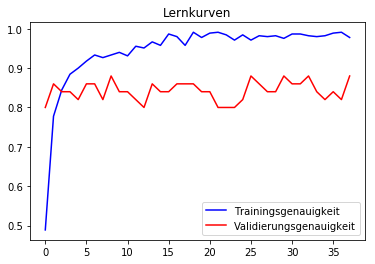

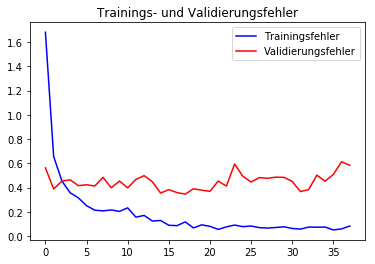

              precision    recall  f1-score   support

     T-shirt       0.77      0.77      0.77      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.79      0.50      0.61      1000
       Dress       0.80      0.86      0.83      1000
        Coat       0.66      0.75      0.70      1000
      Sandal       0.82      0.95      0.88      1000
       Shirt       0.47      0.54      0.50      1000
     Sneaker       0.89      0.89      0.89      1000
         Bag       0.90      0.93      0.92      1000
  Ankle-boot       0.96      0.86      0.91      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



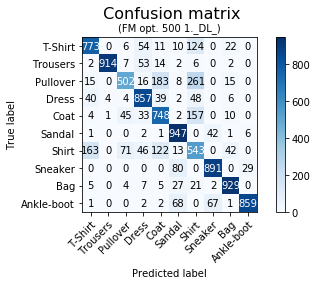

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_7 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
activation_7 (Activation)    (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_8 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
activation_8 (Activation)    (None, 28, 28, 32)        0   

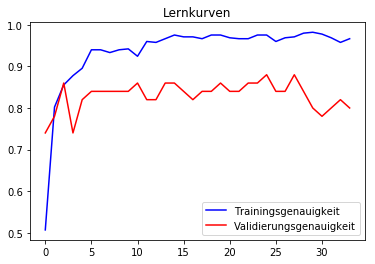

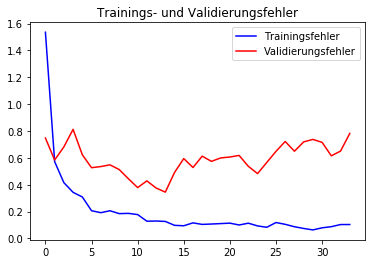

              precision    recall  f1-score   support

     T-shirt       0.77      0.79      0.78      1000
    Trousers       0.99      0.93      0.96      1000
    Pullover       0.72      0.55      0.63      1000
       Dress       0.84      0.83      0.83      1000
        Coat       0.66      0.72      0.69      1000
      Sandal       0.90      0.93      0.92      1000
       Shirt       0.47      0.53      0.50      1000
     Sneaker       0.89      0.91      0.90      1000
         Bag       0.89      0.94      0.92      1000
  Ankle-boot       0.94      0.91      0.93      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



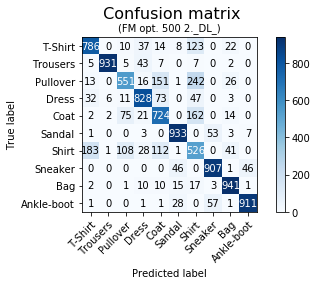

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_7 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_10 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_10 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_11 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_11 (Activation)   (None, 28, 28, 32)        0   

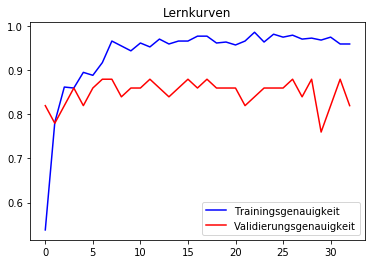

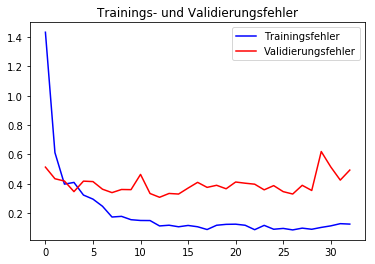

              precision    recall  f1-score   support

     T-shirt       0.73      0.84      0.78      1000
    Trousers       0.99      0.91      0.95      1000
    Pullover       0.79      0.46      0.58      1000
       Dress       0.82      0.83      0.82      1000
        Coat       0.60      0.83      0.69      1000
      Sandal       0.94      0.88      0.91      1000
       Shirt       0.51      0.48      0.50      1000
     Sneaker       0.92      0.86      0.89      1000
         Bag       0.94      0.93      0.93      1000
  Ankle-boot       0.85      0.97      0.91      1000

    accuracy                           0.80     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.81      0.80      0.80     10000



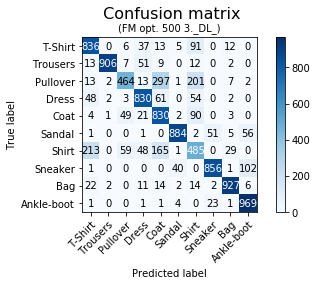

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_13 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_13 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_14 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_14 (Activation)   (None, 28, 28, 32)        0   

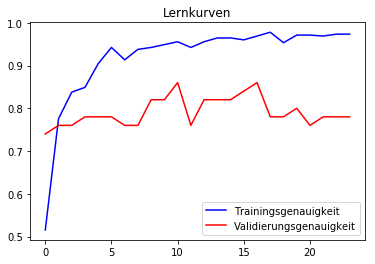

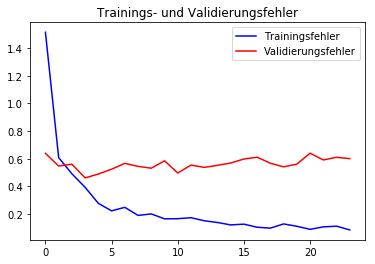

              precision    recall  f1-score   support

     T-shirt       0.76      0.78      0.77      1000
    Trousers       1.00      0.91      0.95      1000
    Pullover       0.80      0.47      0.59      1000
       Dress       0.83      0.82      0.83      1000
        Coat       0.66      0.72      0.69      1000
      Sandal       0.83      0.93      0.87      1000
       Shirt       0.44      0.58      0.50      1000
     Sneaker       0.86      0.89      0.87      1000
         Bag       0.94      0.91      0.93      1000
  Ankle-boot       0.95      0.89      0.92      1000

    accuracy                           0.79     10000
   macro avg       0.81      0.79      0.79     10000
weighted avg       0.81      0.79      0.79     10000



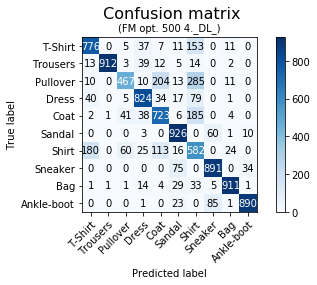

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_16 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_16 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_17 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_17 (Activation)   (None, 28, 28, 32)        0   

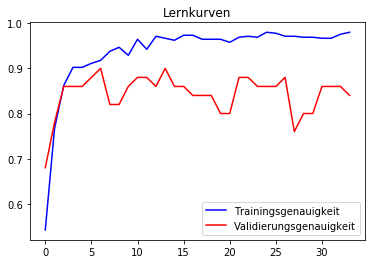

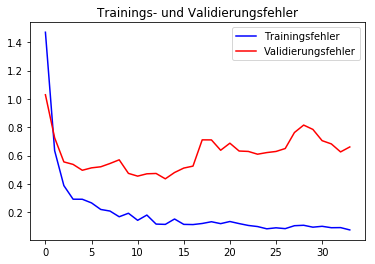

              precision    recall  f1-score   support

     T-shirt       0.70      0.83      0.76      1000
    Trousers       0.98      0.94      0.96      1000
    Pullover       0.74      0.58      0.65      1000
       Dress       0.85      0.80      0.82      1000
        Coat       0.67      0.74      0.70      1000
      Sandal       0.91      0.91      0.91      1000
       Shirt       0.47      0.45      0.46      1000
     Sneaker       0.89      0.88      0.88      1000
         Bag       0.89      0.94      0.91      1000
  Ankle-boot       0.90      0.93      0.92      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000



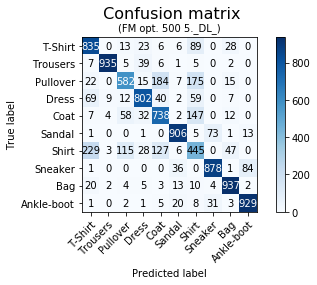

Die durchschnittliche Epochenanzahl beträgt:  12.6


In [0]:
#### Champion aus 1. Durchlauf 5mal testen mit 5 EarlyStopping-Runs
earlyStoppingRuns(1, 5, X_tr_500, y_tr_500, 0.4, 0.001, 1, False, 50, '500')

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_19 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_19 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_20 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_20 (Activation)   (None, 28, 28, 32)        0   

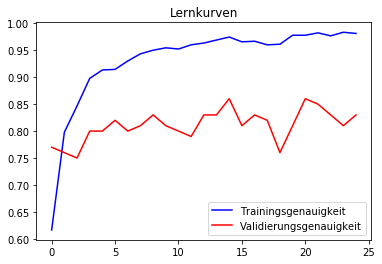

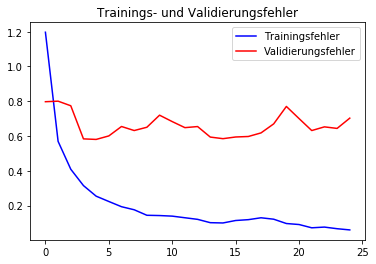

              precision    recall  f1-score   support

     T-shirt       0.74      0.83      0.78      1000
    Trousers       1.00      0.93      0.96      1000
    Pullover       0.78      0.61      0.69      1000
       Dress       0.80      0.88      0.84      1000
        Coat       0.68      0.74      0.71      1000
      Sandal       0.93      0.90      0.91      1000
       Shirt       0.56      0.53      0.54      1000
     Sneaker       0.90      0.86      0.88      1000
         Bag       0.90      0.94      0.92      1000
  Ankle-boot       0.89      0.95      0.92      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



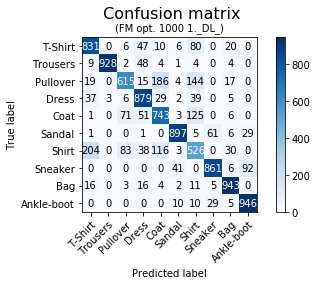

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_22 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_22 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_23 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_23 (Activation)   (None, 28, 28, 32)        0   

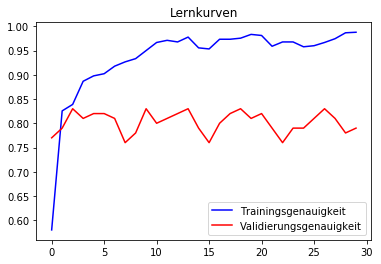

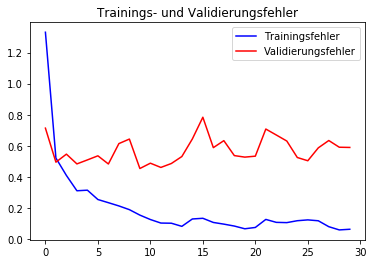

              precision    recall  f1-score   support

     T-shirt       0.80      0.78      0.79      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.81      0.59      0.68      1000
       Dress       0.83      0.86      0.85      1000
        Coat       0.70      0.73      0.71      1000
      Sandal       0.89      0.94      0.92      1000
       Shirt       0.51      0.61      0.56      1000
     Sneaker       0.91      0.91      0.91      1000
         Bag       0.92      0.95      0.94      1000
  Ankle-boot       0.95      0.92      0.94      1000

    accuracy                           0.82     10000
   macro avg       0.83      0.82      0.83     10000
weighted avg       0.83      0.82      0.83     10000



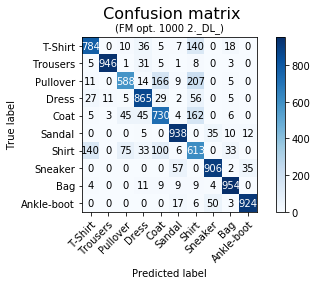

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_25 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_25 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_26 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_26 (Activation)   (None, 28, 28, 32)        0   

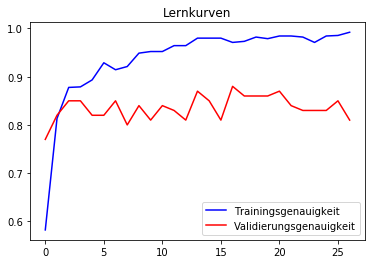

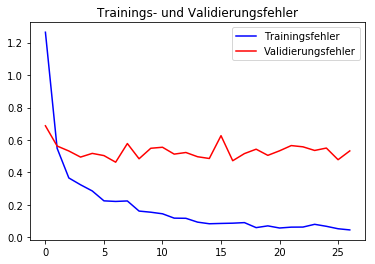

              precision    recall  f1-score   support

     T-shirt       0.78      0.80      0.79      1000
    Trousers       0.98      0.95      0.96      1000
    Pullover       0.78      0.69      0.74      1000
       Dress       0.86      0.84      0.85      1000
        Coat       0.70      0.74      0.72      1000
      Sandal       0.96      0.87      0.91      1000
       Shirt       0.54      0.58      0.56      1000
     Sneaker       0.85      0.92      0.89      1000
         Bag       0.91      0.95      0.93      1000
  Ankle-boot       0.93      0.93      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



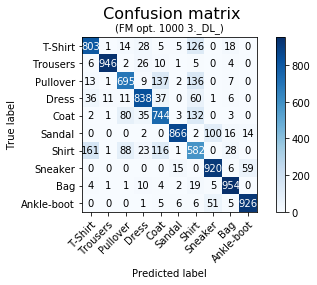

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_19 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_28 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_28 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_29 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_29 (Activation)   (None, 28, 28, 32)        0  

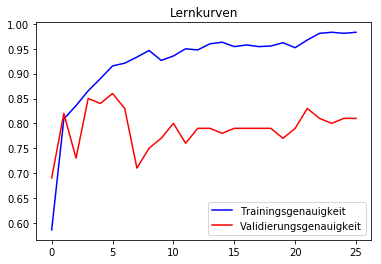

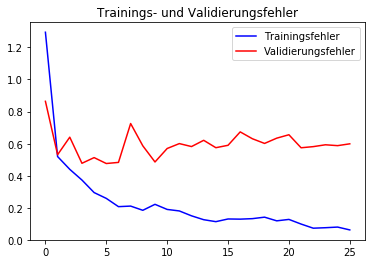

              precision    recall  f1-score   support

     T-shirt       0.75      0.80      0.77      1000
    Trousers       1.00      0.92      0.96      1000
    Pullover       0.71      0.72      0.71      1000
       Dress       0.81      0.85      0.83      1000
        Coat       0.69      0.73      0.71      1000
      Sandal       0.89      0.95      0.92      1000
       Shirt       0.52      0.47      0.50      1000
     Sneaker       0.90      0.90      0.90      1000
         Bag       0.95      0.93      0.94      1000
  Ankle-boot       0.95      0.89      0.92      1000

    accuracy                           0.82     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.82      0.82      0.82     10000



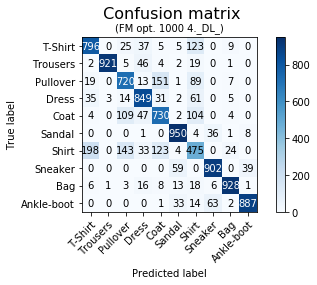

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
relu
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_31 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_31 (Activation)   (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_32 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
activation_32 (Activation)   (None, 28, 28, 32)        0  

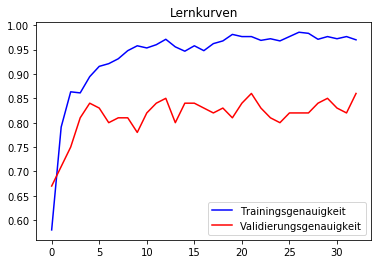

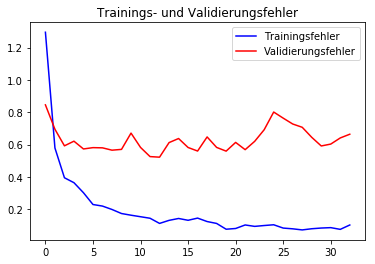

              precision    recall  f1-score   support

     T-shirt       0.77      0.84      0.80      1000
    Trousers       0.99      0.95      0.97      1000
    Pullover       0.67      0.78      0.72      1000
       Dress       0.85      0.85      0.85      1000
        Coat       0.72      0.75      0.74      1000
      Sandal       0.94      0.93      0.93      1000
       Shirt       0.65      0.43      0.52      1000
     Sneaker       0.88      0.93      0.90      1000
         Bag       0.90      0.96      0.93      1000
  Ankle-boot       0.95      0.91      0.93      1000

    accuracy                           0.83     10000
   macro avg       0.83      0.83      0.83     10000
weighted avg       0.83      0.83      0.83     10000



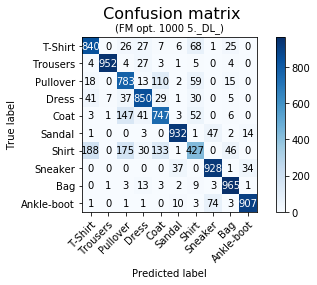

Die durchschnittliche Epochenanzahl beträgt:  8.2


In [0]:
#### Champion aus 1. Durchlauf 5mal testen mit 5 EarlyStopping-Runs, Trainingsmenge 1000
earlyStoppingRuns(1, 5, X_tr_1000, y_tr_1000, 0.4, 0.001, 1, False, 50, '1000')

***************************************************************************** 
1 ._Trainingsdurchlauf mit EarlyStopping
 
elu
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_34 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_1 (ELU)                  (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_35 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_2 (ELU)                  (None, 28, 28, 32)        0   

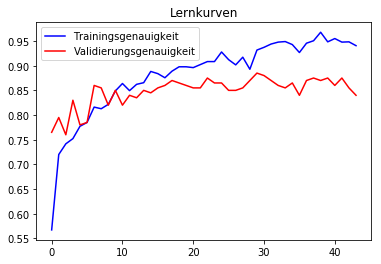

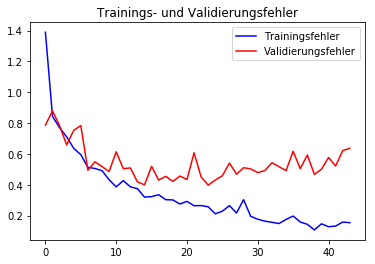

              precision    recall  f1-score   support

     T-shirt       0.81      0.81      0.81      1000
    Trousers       0.99      0.96      0.98      1000
    Pullover       0.90      0.66      0.76      1000
       Dress       0.87      0.85      0.86      1000
        Coat       0.66      0.92      0.77      1000
      Sandal       0.98      0.93      0.95      1000
       Shirt       0.63      0.58      0.60      1000
     Sneaker       0.95      0.87      0.91      1000
         Bag       0.96      0.97      0.96      1000
  Ankle-boot       0.87      0.99      0.92      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



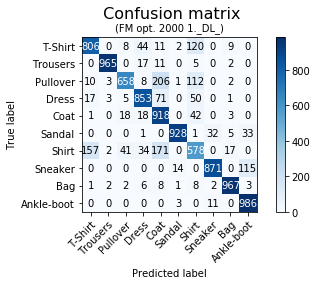

***************************************************************************** 
2 ._Trainingsdurchlauf mit EarlyStopping
 
elu
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_29 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_41 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_8 (ELU)                  (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_42 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_9 (ELU)                  (None, 28, 28, 32)        0   

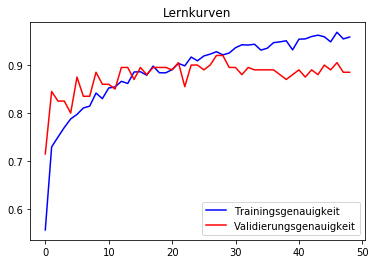

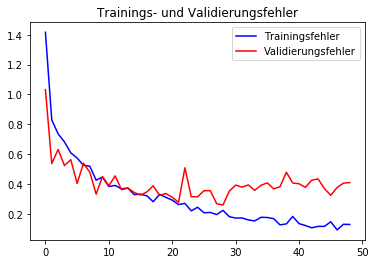

              precision    recall  f1-score   support

     T-shirt       0.82      0.82      0.82      1000
    Trousers       0.96      0.97      0.96      1000
    Pullover       0.81      0.81      0.81      1000
       Dress       0.83      0.88      0.86      1000
        Coat       0.79      0.77      0.78      1000
      Sandal       0.97      0.91      0.94      1000
       Shirt       0.66      0.62      0.64      1000
     Sneaker       0.92      0.95      0.94      1000
         Bag       0.96      0.96      0.96      1000
  Ankle-boot       0.92      0.96      0.94      1000

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000



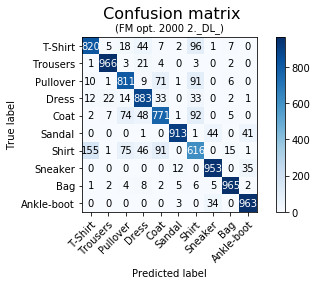

***************************************************************************** 
3 ._Trainingsdurchlauf mit EarlyStopping
 
elu
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_35 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_48 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_15 (ELU)                 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_49 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_16 (ELU)                 (None, 28, 28, 32)        0   

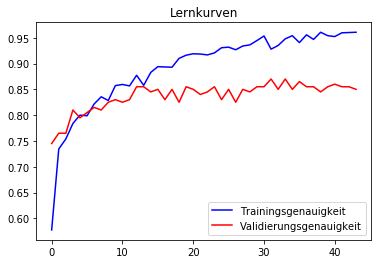

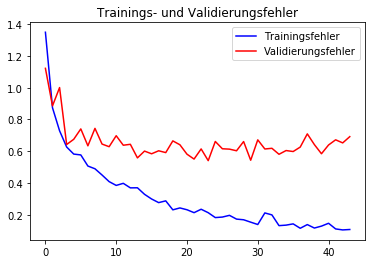

              precision    recall  f1-score   support

     T-shirt       0.74      0.89      0.80      1000
    Trousers       0.98      0.96      0.97      1000
    Pullover       0.83      0.77      0.80      1000
       Dress       0.88      0.81      0.85      1000
        Coat       0.74      0.79      0.76      1000
      Sandal       0.99      0.85      0.92      1000
       Shirt       0.63      0.59      0.61      1000
     Sneaker       0.86      0.95      0.91      1000
         Bag       0.98      0.94      0.96      1000
  Ankle-boot       0.92      0.97      0.94      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



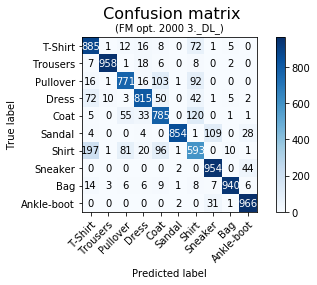

***************************************************************************** 
4 ._Trainingsdurchlauf mit EarlyStopping
 
elu
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_41 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_55 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_22 (ELU)                 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_56 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_23 (ELU)                 (None, 28, 28, 32)        0   

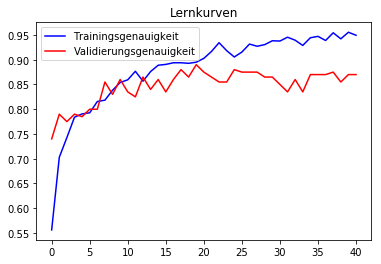

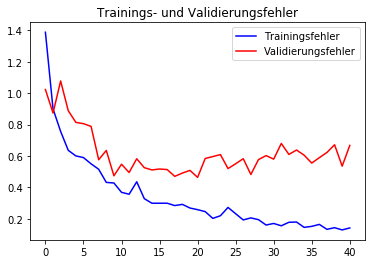

              precision    recall  f1-score   support

     T-shirt       0.77      0.85      0.81      1000
    Trousers       1.00      0.95      0.97      1000
    Pullover       0.74      0.86      0.80      1000
       Dress       0.86      0.87      0.86      1000
        Coat       0.76      0.79      0.77      1000
      Sandal       0.96      0.91      0.93      1000
       Shirt       0.70      0.49      0.57      1000
     Sneaker       0.90      0.94      0.92      1000
         Bag       0.95      0.97      0.96      1000
  Ankle-boot       0.93      0.95      0.94      1000

    accuracy                           0.86     10000
   macro avg       0.86      0.86      0.85     10000
weighted avg       0.86      0.86      0.85     10000



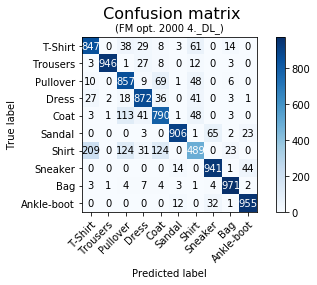

***************************************************************************** 
5 ._Trainingsdurchlauf mit EarlyStopping
 
elu
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_47 (Conv2D)           (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_62 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_29 (ELU)                 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 28, 28, 32)        9248      
_________________________________________________________________
batch_normalization_63 (Batc (None, 28, 28, 32)        128       
_________________________________________________________________
elu_30 (ELU)                 (None, 28, 28, 32)        0   

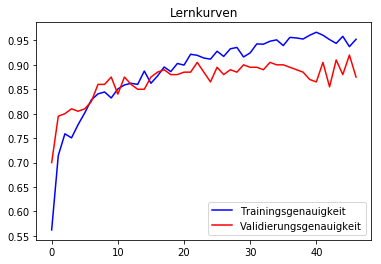

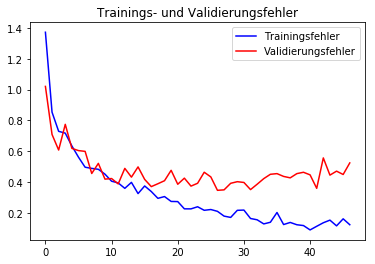

              precision    recall  f1-score   support

     T-shirt       0.79      0.85      0.82      1000
    Trousers       1.00      0.94      0.97      1000
    Pullover       0.71      0.83      0.77      1000
       Dress       0.89      0.81      0.85      1000
        Coat       0.82      0.65      0.73      1000
      Sandal       0.97      0.94      0.95      1000
       Shirt       0.57      0.64      0.60      1000
     Sneaker       0.93      0.94      0.94      1000
         Bag       0.96      0.95      0.95      1000
  Ankle-boot       0.94      0.96      0.95      1000

    accuracy                           0.85     10000
   macro avg       0.86      0.85      0.85     10000
weighted avg       0.86      0.85      0.85     10000



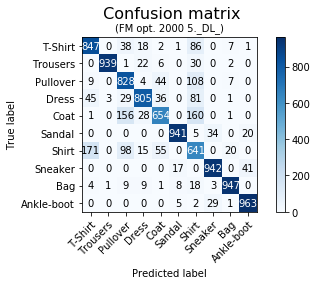

Die durchschnittliche Epochenanzahl beträgt:  25.0


In [0]:
#### Champion aus 1. Durchlauf 5mal testen mit 5 EarlyStopping-Runs, Trainingsmenge 2000
earlyStoppingRuns(1, 5, X_tr_2000, y_tr_2000, 0.3, 0.001, 3, False, 50, '2000')

In [0]:
downloader_ES(2000)

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.01 und normalen Dropout
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4],[0.01],[1,2,3], [False], 10, 
          1)
f = open("GridSearch_1DL_500_lr_01_234_123.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")

fitten










Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 8s 19ms/step - loss: 1.6462 - acc: 0.5309 - val_loss: 3.8690 - val_acc: 0.3200
Epoch 2/300
405/405 [==============================] - 0s 312us/step - loss: 0.7505 - acc: 0.7704 - val_loss: 1.4248 - val_acc: 0.6000
Epoch 3/300
405/405 [==============================] - 0s 304us/step - loss: 0.6668 - acc: 0.7975 - val_loss: 1.3152 - val_acc: 0.6800
Epoch 4/300
405/405 [==============================] - 0s 298us/step - loss: 0.4805 - acc: 0.8173 - val_loss: 1.1120 - val_acc: 0.8200
Epoch 5/300
405/405 [==============================] - 0s 316us/step - loss: 0.4092 - acc: 0.8593 - val_loss: 1.2206 - val_acc: 0.7600
Epoch 6/300
405/405 [=========================

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 10s 25ms/step - loss: 1.5791 - acc: 0.5432 - val_loss: 2.4877 - val_acc: 0.5200
Epoch 2/300
405/405 [==============================] - 0s 403us/step - loss: 0.9405 - acc: 0.6938 - val_loss: 1.2478 - val_acc: 0.6800
Epoch 3/300
405/405 [==============================] - 0s 386us/step - loss: 0.5708 - acc: 0.8000 - val_loss: 3.1582 - val_acc: 0.4000
Epoch 4/300
405/405 [==============================] - 0s 373us/step - loss: 0.4544 - acc: 0.8272 - val_loss: 1.0993 - val_acc: 0.7200
Epoch 5/300
405/405 [==============================] - 0s 375us/step - loss: 0.3843 - acc: 0.8741 - val_loss: 0.7575 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 365us/step - loss: 0.2038 - acc: 0.9259 - val_loss: 1.5730 - val_acc: 0.7000
Epoch 7/300
405/405 [==============================] - 0s 366us/step - loss: 0.2056 - acc: 0.9136 - val_loss: 1.5213 - val_acc: 0.7800
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 10s 26ms/step - loss: 1.6835 - acc: 0.5383 - val_loss: 2.4374 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 402us/step - loss: 0.8332 - acc: 0.7284 - val_loss: 3.5475 - val_acc: 0.2800
Epoch 3/300
405/405 [==============================] - 0s 384us/step - loss: 0.5706 - acc: 0.7975 - val_loss: 0.8993 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 378us/step - loss: 0.4574 - acc: 0.8296 - val_loss: 0.6676 - val_acc: 0.8800
Epoch 5/300
405/405 [==============================] - 0s 363us/step - loss: 0.4014 - acc: 0.8370 - val_loss: 5.1372 - val_acc: 0.3200
Epoch 6/300
405/405 [==============================] - 0s 370us/step - loss: 0.3257 - acc: 0.8864 - val_loss: 1.4806 - val_acc: 0.7400
Epoch 7/300
405/405 [==============================] - 0s 380us/step - loss: 0.3234 - acc: 0.8519 - val_loss: 0.9561 - val_acc: 0.8600
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 13s 31ms/step - loss: 1.9312 - acc: 0.4716 - val_loss: 3.4203 - val_acc: 0.5600
Epoch 2/300
405/405 [==============================] - 0s 510us/step - loss: 1.1513 - acc: 0.6519 - val_loss: 1.3138 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 444us/step - loss: 0.8709 - acc: 0.7185 - val_loss: 2.3454 - val_acc: 0.4600
Epoch 4/300
405/405 [==============================] - 0s 441us/step - loss: 0.6625 - acc: 0.7704 - val_loss: 0.8563 - val_acc: 0.7200
Epoch 5/300
405/405 [==============================] - 0s 437us/step - loss: 0.6626 - acc: 0.7802 - val_loss: 2.1711 - val_acc: 0.6200
Epoch 6/300
405/405 [==============================] - 0s 431us/step - loss: 0.4553 - acc: 0.8198 - val_loss: 1.0990 - val_acc: 0.6800
Epoch 7/300
405/405 [==============================] - 0s 428us/step - loss: 0.4428 - acc: 0.8420 - val_loss: 2.2021 - val_acc: 0.5800
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 14s 34ms/step - loss: 2.0168 - acc: 0.4543 - val_loss: 4.8777 - val_acc: 0.4200
Epoch 2/300
405/405 [==============================] - 0s 470us/step - loss: 1.0642 - acc: 0.6617 - val_loss: 1.6381 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 478us/step - loss: 0.9051 - acc: 0.6667 - val_loss: 0.9267 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 451us/step - loss: 0.7282 - acc: 0.7481 - val_loss: 5.8083 - val_acc: 0.4000
Epoch 5/300
405/405 [==============================] - 0s 452us/step - loss: 0.7359 - acc: 0.7580 - val_loss: 2.4595 - val_acc: 0.6600
Epoch 6/300
405/405 [==============================] - 0s 426us/step - loss: 0.6205 - acc: 0.7802 - val_loss: 1.4623 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 426us/step - loss: 0.5174 - acc: 0.8321 - val_loss: 1.5461 - val_acc: 0.7000
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 20s 48ms/step - loss: 1.5066 - acc: 0.5531 - val_loss: 1.6819 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 448us/step - loss: 0.8436 - acc: 0.7309 - val_loss: 1.1340 - val_acc: 0.7800
Epoch 3/300
405/405 [==============================] - 0s 462us/step - loss: 0.4985 - acc: 0.8173 - val_loss: 0.8191 - val_acc: 0.7600
Epoch 4/300
405/405 [==============================] - 0s 460us/step - loss: 0.4821 - acc: 0.8049 - val_loss: 0.6996 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 439us/step - loss: 0.3887 - acc: 0.8691 - val_loss: 0.9025 - val_acc: 0.7600
Epoch 6/300
405/405 [==============================] - 0s 432us/step - loss: 0.3238 - acc: 0.8963 - val_loss: 0.8418 - val_acc: 0.8400
Epoch 7/300
405/405 [==============================] - 0s 423us/step - loss: 0.2299 - acc: 0.9160 - val_loss: 0.8713 - val_acc: 0.8200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 26s 65ms/step - loss: 2.7063 - acc: 0.3679 - val_loss: 7.7541 - val_acc: 0.3400
Epoch 2/300
405/405 [==============================] - 0s 638us/step - loss: 1.5840 - acc: 0.5580 - val_loss: 11.5718 - val_acc: 0.1200
Epoch 3/300
405/405 [==============================] - 0s 608us/step - loss: 1.2321 - acc: 0.6049 - val_loss: 6.2086 - val_acc: 0.4400
Epoch 4/300
405/405 [==============================] - 0s 604us/step - loss: 1.0533 - acc: 0.6716 - val_loss: 3.9304 - val_acc: 0.5000
Epoch 5/300
405/405 [==============================] - 0s 583us/step - loss: 1.0788 - acc: 0.6568 - val_loss: 2.9164 - val_acc: 0.6000
Epoch 6/300
405/405 [==============================] - 0s 567us/step - loss: 0.8810 - acc: 0.7160 - val_loss: 1.7539 - val_acc: 0.6200
Epoch 7/300
405/405 [==============================] - 0s 568us/step - loss: 0.9241 - acc: 0.7481 - val_loss: 1.6700 - val_acc: 0.6400
Epoch

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.800000 using {'conv_dropout': 0.4, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.819825 (0.031950) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.810202 (0.049583) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.792984 (0.050923) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.791159 (0.092387) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.806500 (0.039644) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.796167 (0.064151) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.809513 (0.0

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")

fitten
relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 28s 70ms/step - loss: 1.3882 - acc: 0.5284 - val_loss: 0.6349 - val_acc: 0.7600
Epoch 2/300
405/405 [==============================] - 0s 520us/step - loss: 0.5084 - acc: 0.8247 - val_loss: 0.6773 - val_acc: 0.7600
Epoch 3/300
405/405 [==============================] - 0s 505us/step - loss: 0.3599 - acc: 0.8765 - val_loss: 0.5762 - val_acc: 0.8200
Epoch 4/300
405/405 [==============================] - 0s 507us/step - loss: 0.2482 - acc: 0.9136 - val_loss: 0.8036 - val_acc: 0.8200
Epoch 5/300
405/405 [==============================] - 0s 520us/step - loss: 0.1789 - acc: 0.9333 - val_loss: 0.6205 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 501us/step - loss: 0.1120 - acc: 0.9679 - val_loss: 0.7031 - val_acc: 0.8400
Epoch 7/300
405/405 [==============================] - 0s 503us/step - loss: 0.0647 - acc: 0.9877 - val_loss: 0.6542 - val_acc: 0.840

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 31s 77ms/step - loss: 1.7305 - acc: 0.4519 - val_loss: 0.6493 - val_acc: 0.8000
Epoch 2/300
405/405 [==============================] - 0s 613us/step - loss: 0.8432 - acc: 0.6765 - val_loss: 0.6722 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 563us/step - loss: 0.6920 - acc: 0.7309 - val_loss: 0.5900 - val_acc: 0.7200
Epoch 4/300
405/405 [==============================] - 0s 571us/step - loss: 0.5611 - acc: 0.8148 - val_loss: 0.4670 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 560us/step - loss: 0.4079 - acc: 0.8519 - val_loss: 0.5864 - val_acc: 0.8800
Epoch 6/300
405/405 [==============================] - 0s 535us/step - loss: 0.2859 - acc: 0.9012 - val_loss: 0.5945 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 589us/step - loss: 0.2695 - acc: 0.9062 - val_loss: 0.5440 - val_acc: 0.8400
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 34s 85ms/step - loss: 1.9684 - acc: 0.4148 - val_loss: 1.3608 - val_acc: 0.5800
Epoch 2/300
405/405 [==============================] - 0s 678us/step - loss: 1.1029 - acc: 0.6395 - val_loss: 0.7711 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 654us/step - loss: 0.7580 - acc: 0.7235 - val_loss: 1.2441 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 634us/step - loss: 0.6536 - acc: 0.7753 - val_loss: 0.5186 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 631us/step - loss: 0.5285 - acc: 0.8025 - val_loss: 0.6519 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 631us/step - loss: 0.5605 - acc: 0.7901 - val_loss: 0.4957 - val_acc: 0.8600
Epoch 7/300
405/405 [==============================] - 0s 632us/step - loss: 0.4132 - acc: 0.8691 - val_loss: 0.8031 - val_acc: 0.7600
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 46s 113ms/step - loss: 2.1360 - acc: 0.3086 - val_loss: 1.4630 - val_acc: 0.6400
Epoch 2/300
405/405 [==============================] - 0s 774us/step - loss: 1.1515 - acc: 0.6370 - val_loss: 0.7381 - val_acc: 0.8200
Epoch 3/300
405/405 [==============================] - 0s 713us/step - loss: 0.9569 - acc: 0.6716 - val_loss: 0.7425 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 737us/step - loss: 0.7935 - acc: 0.7407 - val_loss: 0.7835 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 708us/step - loss: 0.7491 - acc: 0.7284 - val_loss: 0.9194 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 697us/step - loss: 0.7286 - acc: 0.7457 - val_loss: 0.7981 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 704us/step - loss: 0.7131 - acc: 0.7432 - val_loss: 0.7292 - val_acc: 0.8800
Epoch

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.826667 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.831196 (0.071797) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.831028 (0.059368) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.827040 (0.064014) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.812635 (0.051104) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.834583 (0.054712) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.808756 (0.044286) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.8594

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
# Dropoutrate 0.6
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.6], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_6_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 2s 5ms/step - loss: 1.5776 - acc: 0.4988 - val_loss: 0.6435 - val_acc: 0.7600
Epoch 2/300
405/405 [==============================] - 0s 225us/step - loss: 0.6533 - acc: 0.7432 - val_loss: 0.7806 - val_acc: 0.8000
Epoch 3/300
405/405 [==============================] - 0s 223us/step - loss: 0.5292 - acc: 0.8049 - val_loss: 0.5156 - val_acc: 0.8400
Epoch 4/300
405/405 [==============================] - 0s 240us/step - loss: 0.4180 - acc: 0.8395 - val_loss: 0.5705 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 234us/step - loss: 0.3257 - acc: 0.8938 - val_loss: 0.6330 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] -

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 3s 8ms/step - loss: 2.3912 - acc: 0.2321 - val_loss: 1.2811 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 312us/step - loss: 1.4787 - acc: 0.5012 - val_loss: 0.9232 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 0s 293us/step - loss: 1.1334 - acc: 0.5877 - val_loss: 0.6607 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 281us/step - loss: 1.0169 - acc: 0.6617 - val_loss: 0.6236 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 291us/step - loss: 0.8799 - acc: 0.6741 - val_loss: 0.6347 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 312us/step - loss: 0.8540 - acc: 0.6840 - val_loss: 0.5795 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 310us/step - loss: 0.8183 - acc: 0.7111 - val_loss: 0.5655 - val_acc: 0.7400
Epoch 8

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 5s 13ms/step - loss: 2.4330 - acc: 0.2395 - val_loss: 1.1859 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 343us/step - loss: 1.4872 - acc: 0.5012 - val_loss: 0.7600 - val_acc: 0.7600
Epoch 3/300
405/405 [==============================] - 0s 365us/step - loss: 1.1779 - acc: 0.5852 - val_loss: 0.5999 - val_acc: 0.7600
Epoch 4/300
405/405 [==============================] - 0s 322us/step - loss: 1.0013 - acc: 0.6395 - val_loss: 0.6241 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 303us/step - loss: 0.9347 - acc: 0.6840 - val_loss: 0.5743 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 329us/step - loss: 0.8713 - acc: 0.6988 - val_loss: 0.5739 - val_acc: 0.8400
Epoch 7/300
405/405 [==============================] - 0s 337us/step - loss: 0.8090 - acc: 0.7185 - val_loss: 0.5841 - val_acc: 0.8000
Epoch 

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_001_6_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.0001 und normalen Dropout
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.0001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_0001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")

Epoch 4/300
405/405 [==============================] - 0s 362us/step - loss: 0.7118 - acc: 0.7358 - val_loss: 0.6206 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 349us/step - loss: 0.6076 - acc: 0.8000 - val_loss: 0.6150 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 338us/step - loss: 0.6257 - acc: 0.7778 - val_loss: 0.6149 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 350us/step - loss: 0.4948 - acc: 0.8395 - val_loss: 0.6314 - val_acc: 0.8200
Epoch 8/300
405/405 [==============================] - 0s 353us/step - loss: 0.4456 - acc: 0.8593 - val_loss: 0.5816 - val_acc: 0.8400
Epoch 9/300
405/405 [==============================] - 0s 358us/step - loss: 0.3548 - acc: 0.8864 - val_loss: 0.5476 - val_acc: 0.8200
Epoch 10/300
405/405 [==============================] - 0s 346us/step - loss: 0.3694 - acc: 0.8815 - val_loss: 0.5382 - val_acc: 0.8400
Epoch 11/300
405/405 [==============================] 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 30s 75ms/step - loss: 3.1912 - acc: 0.1333 - val_loss: 1.9674 - val_acc: 0.3000
Epoch 2/300
405/405 [==============================] - 0s 651us/step - loss: 2.5222 - acc: 0.2370 - val_loss: 1.5272 - val_acc: 0.4800
Epoch 3/300
Epoch 3/300
405/405 [==============================] - 0s 634us/step - loss: 2.2385 - acc: 0.2914 - val_loss: 1.2947 - val_acc: 0.5400
Epoch 4/300
Epoch 4/300
405/405 [==============================] - 0s 653us/step - loss: 2.1054 - acc: 0.3457 - val_loss: 1.1260 - val_acc: 0.6000
Epoch 5/300Epoch 5/300
405/405 [==============================] - 0s 667us/step - loss: 2.0000 - acc: 0.3210 - val_loss: 0.9948 - val_acc: 0.6400
Epoch 6/300Epoch 6/300
405/405 [==============================] - 0s 665us/step - loss: 1.7464 - acc: 0.3975 - val_loss: 0.9200 - val_acc: 0.6400
Epoch 7/300Epoch 7/300
405/405 [==

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.800000 using {'conv_dropout': 0.4, 'learn_rate': 0.0001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.822667 (0.067718) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.825750 (0.039740) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.797746 (0.042719) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.834972 (0.048668) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.811874 (0.041280) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.815628 (0.041817) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score:

In [0]:
########## NICHT   VERWENDEN    !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#########################################################################################
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.01 und SpatialDropout2D
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [True], 10, 1)
f = open("GridSearch_1DL_500_lr_01_234_123_True.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")

relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 42s 104ms/step - loss: 1.7390 - acc: 0.4889 - val_loss: 2.5215 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 0s 519us/step - loss: 0.9083 - acc: 0.6963 - val_loss: 2.4764 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 0s 516us/step - loss: 0.6912 - acc: 0.7753 - val_loss: 3.4605 - val_acc: 0.3800
Epoch 4/300
405/405 [==============================] - 0s 504us/step - loss: 0.6536 - acc: 0.7704 - val_loss: 1.8300 - val_acc: 0.7400
Epoch 5/300
405/405 [==============================] - 0s 497us/step - loss: 0.5768 - acc: 0.8025 - val_loss: 1.3442 - val_acc: 0.7200
Epoch 6/300
405/405 [==============================] - 0s 503us/step - loss: 0.4207 - acc: 0.8593 - val_loss: 0.9605 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 486us/step - loss: 0.3313 - acc: 0.8765 - val_loss: 1.2855 - val_acc: 0.7600
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 36s 90ms/step - loss: 1.6826 - acc: 0.4864 - val_loss: 3.2234 - val_acc: 0.6400
Epoch 2/300
405/405 [==============================] - 0s 509us/step - loss: 0.9374 - acc: 0.7185 - val_loss: 1.5485 - val_acc: 0.6200
Epoch 3/300
405/405 [==============================] - 0s 482us/step - loss: 0.6458 - acc: 0.7679 - val_loss: 1.1334 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 496us/step - loss: 0.4589 - acc: 0.8346 - val_loss: 0.9687 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 514us/step - loss: 0.4785 - acc: 0.8346 - val_loss: 1.2210 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 493us/step - loss: 0.4145 - acc: 0.8420 - val_loss: 1.3096 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 510us/step - loss: 0.3435 - acc: 0.8815 - val_loss: 1.2921 - val_acc: 0.7200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 38s 94ms/step - loss: 1.7159 - acc: 0.5210 - val_loss: 5.1071 - val_acc: 0.4400
Epoch 2/300
405/405 [==============================] - 0s 535us/step - loss: 1.1675 - acc: 0.6864 - val_loss: 1.5354 - val_acc: 0.5600
Epoch 3/300
405/405 [==============================] - 0s 498us/step - loss: 0.7631 - acc: 0.7531 - val_loss: 6.3712 - val_acc: 0.3000
Epoch 4/300
405/405 [==============================] - 0s 520us/step - loss: 0.6147 - acc: 0.7877 - val_loss: 1.0063 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 530us/step - loss: 0.4567 - acc: 0.8494 - val_loss: 0.8855 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] - 0s 508us/step - loss: 0.4500 - acc: 0.8444 - val_loss: 0.9001 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 527us/step - loss: 0.3424 - acc: 0.8790 - val_loss: 0.9350 - val_acc: 0.8200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 45s 111ms/step - loss: 3.2893 - acc: 0.3259 - val_loss: 7.9222 - val_acc: 0.4200
Epoch 2/300
405/405 [==============================] - 0s 729us/step - loss: 1.7742 - acc: 0.4617 - val_loss: 7.8450 - val_acc: 0.2200
Epoch 3/300
405/405 [==============================] - 0s 713us/step - loss: 1.3139 - acc: 0.5630 - val_loss: 3.2117 - val_acc: 0.6600
Epoch 4/300
405/405 [==============================] - 0s 716us/step - loss: 1.4974 - acc: 0.5704 - val_loss: 1.9404 - val_acc: 0.7000
Epoch 5/300
405/405 [==============================] - 0s 736us/step - loss: 1.2118 - acc: 0.5926 - val_loss: 2.6972 - val_acc: 0.5200
Epoch 6/300
405/405 [==============================] - 0s 729us/step - loss: 1.1858 - acc: 0.6222 - val_loss: 1.4873 - val_acc: 0.6600
Epoch 7/300
405/405 [==============================] - 0s 721us/step - loss: 1.0565 - acc: 0.6370 - val_loss: 1.8201 - val_acc: 0.4800
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 46s 113ms/step - loss: 3.3369 - acc: 0.3210 - val_loss: 10.6610 - val_acc: 0.2400
Epoch 2/300
405/405 [==============================] - 0s 740us/step - loss: 1.8480 - acc: 0.5037 - val_loss: 5.0436 - val_acc: 0.4600
Epoch 3/300
405/405 [==============================] - 0s 689us/step - loss: 1.4464 - acc: 0.5284 - val_loss: 2.7415 - val_acc: 0.6200
Epoch 4/300
405/405 [==============================] - 0s 738us/step - loss: 1.3100 - acc: 0.6074 - val_loss: 1.8826 - val_acc: 0.6200
Epoch 5/300
405/405 [==============================] - 0s 721us/step - loss: 1.2187 - acc: 0.6543 - val_loss: 1.8468 - val_acc: 0.6600
Epoch 6/300
405/405 [==============================] - 0s 720us/step - loss: 1.1345 - acc: 0.6296 - val_loss: 1.5123 - val_acc: 0.5400
Epoch 7/300
405/405 [==============================] - 0s 735us/step - loss: 0.9796 - acc: 0.6963 - val_loss: 1.0297 - val_acc: 0.7400
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 47s 115ms/step - loss: 2.6529 - acc: 0.4025 - val_loss: 7.0428 - val_acc: 0.4800
Epoch 2/300
405/405 [==============================] - 0s 764us/step - loss: 1.3896 - acc: 0.5630 - val_loss: 1.3323 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 0s 726us/step - loss: 1.3406 - acc: 0.5802 - val_loss: 1.7849 - val_acc: 0.6200
Epoch 4/300
405/405 [==============================] - 0s 709us/step - loss: 0.9829 - acc: 0.6716 - val_loss: 1.3498 - val_acc: 0.6600
Epoch 5/300
405/405 [==============================] - 0s 742us/step - loss: 1.1954 - acc: 0.6123 - val_loss: 1.3972 - val_acc: 0.7000
Epoch 6/300
405/405 [==============================] - 0s 743us/step - loss: 1.0063 - acc: 0.6741 - val_loss: 0.9899 - val_acc: 0.7200
Epoch 7/300
405/405 [==============================] - 0s 729us/step - loss: 1.0276 - acc: 0.6741 - val_loss: 0.9063 - val_acc: 0.7800
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 56s 138ms/step - loss: 2.9573 - acc: 0.3531 - val_loss: 5.1838 - val_acc: 0.5400
Epoch 2/300
405/405 [==============================] - 0s 788us/step - loss: 1.8234 - acc: 0.4938 - val_loss: 3.6625 - val_acc: 0.4600
Epoch 3/300
405/405 [==============================] - 0s 771us/step - loss: 1.7030 - acc: 0.4914 - val_loss: 3.2324 - val_acc: 0.5800
Epoch 4/300
405/405 [==============================] - 0s 767us/step - loss: 1.2779 - acc: 0.5704 - val_loss: 2.5698 - val_acc: 0.4600
Epoch 5/300
405/405 [==============================] - 0s 780us/step - loss: 1.4531 - acc: 0.5704 - val_loss: 1.9125 - val_acc: 0.6000
Epoch 6/300
405/405 [==============================] - 0s 762us/step - loss: 1.4379 - acc: 0.5827 - val_loss: 1.8309 - val_acc: 0.7000
Epoch 7/300
405/405 [==============================] - 0s 784us/step - loss: 1.1987 - acc: 0.6198 - val_loss: 1.4088 - val_acc: 0.7000
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 60s 148ms/step - loss: 2.0901 - acc: 0.4642 - val_loss: 2.3556 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 0s 663us/step - loss: 1.0730 - acc: 0.6691 - val_loss: 1.2357 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 0s 638us/step - loss: 0.8784 - acc: 0.6938 - val_loss: 1.2060 - val_acc: 0.7200
Epoch 4/300
405/405 [==============================] - 0s 640us/step - loss: 0.7387 - acc: 0.7358 - val_loss: 0.6907 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 606us/step - loss: 0.5452 - acc: 0.8049 - val_loss: 0.8099 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] - 0s 621us/step - loss: 0.5577 - acc: 0.8000 - val_loss: 0.8480 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 613us/step - loss: 0.4844 - acc: 0.8173 - val_loss: 0.9145 - val_acc: 0.8400
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 60s 149ms/step - loss: 2.5030 - acc: 0.3259 - val_loss: 3.7405 - val_acc: 0.5600
Epoch 2/300
405/405 [==============================] - 0s 717us/step - loss: 1.7346 - acc: 0.4765 - val_loss: 1.9102 - val_acc: 0.6400
Epoch 3/300
405/405 [==============================] - 0s 717us/step - loss: 1.2472 - acc: 0.5704 - val_loss: 1.3304 - val_acc: 0.6600
Epoch 4/300
405/405 [==============================] - 0s 717us/step - loss: 1.0236 - acc: 0.6370 - val_loss: 1.8763 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 722us/step - loss: 1.0212 - acc: 0.7037 - val_loss: 0.8698 - val_acc: 0.7400
Epoch 6/300
405/405 [==============================] - 0s 699us/step - loss: 0.9543 - acc: 0.6741 - val_loss: 0.9490 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 726us/step - loss: 0.8332 - acc: 0.7284 - val_loss: 0.7528 - val_acc: 0.7400
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 62s 153ms/step - loss: 2.7210 - acc: 0.3111 - val_loss: 6.1493 - val_acc: 0.5400
Epoch 2/300
405/405 [==============================] - 0s 736us/step - loss: 1.5054 - acc: 0.5037 - val_loss: 2.9464 - val_acc: 0.6200
Epoch 3/300
405/405 [==============================] - 0s 714us/step - loss: 1.2984 - acc: 0.6049 - val_loss: 1.1727 - val_acc: 0.7200
Epoch 4/300
405/405 [==============================] - 0s 712us/step - loss: 1.0491 - acc: 0.6420 - val_loss: 1.8718 - val_acc: 0.6800
Epoch 5/300
405/405 [==============================] - 0s 714us/step - loss: 0.9861 - acc: 0.7037 - val_loss: 0.7464 - val_acc: 0.7600
Epoch 6/300
405/405 [==============================] - 0s 725us/step - loss: 0.8058 - acc: 0.7037 - val_loss: 0.8932 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 724us/step - loss: 0.7698 - acc: 0.7259 - val_loss: 0.5294 - val_acc: 0.8000
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 62s 154ms/step - loss: 2.5769 - acc: 0.3481 - val_loss: 4.0418 - val_acc: 0.4600
Epoch 2/300
405/405 [==============================] - 0s 706us/step - loss: 1.5409 - acc: 0.5185 - val_loss: 3.6794 - val_acc: 0.5000
Epoch 3/300
405/405 [==============================] - 0s 690us/step - loss: 1.3772 - acc: 0.5407 - val_loss: 3.6697 - val_acc: 0.5400
Epoch 4/300
405/405 [==============================] - 0s 687us/step - loss: 1.1055 - acc: 0.6370 - val_loss: 0.7903 - val_acc: 0.8200
Epoch 5/300
405/405 [==============================] - 0s 730us/step - loss: 0.9753 - acc: 0.6420 - val_loss: 0.8456 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 731us/step - loss: 0.8353 - acc: 0.6864 - val_loss: 0.9370 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 720us/step - loss: 0.8966 - acc: 0.7086 - val_loss: 0.8322 - val_acc: 0.8200
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 63s 155ms/step - loss: 2.5036 - acc: 0.3506 - val_loss: 5.6152 - val_acc: 0.4800
Epoch 2/300
405/405 [==============================] - 0s 733us/step - loss: 1.5293 - acc: 0.4889 - val_loss: 1.4839 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 718us/step - loss: 1.2482 - acc: 0.5778 - val_loss: 3.6405 - val_acc: 0.4800
Epoch 4/300
405/405 [==============================] - 0s 702us/step - loss: 1.2690 - acc: 0.5975 - val_loss: 3.8068 - val_acc: 0.5000
Epoch 5/300
405/405 [==============================] - 0s 745us/step - loss: 0.8823 - acc: 0.7358 - val_loss: 1.2749 - val_acc: 0.7000
Epoch 6/300
405/405 [==============================] - 0s 694us/step - loss: 0.9970 - acc: 0.6790 - val_loss: 1.9252 - val_acc: 0.7200
Epoch 7/300
405/405 [==============================] - 0s 731us/step - loss: 0.7778 - acc: 0.7037 - val_loss: 1.7618 - val_acc: 0.7800
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 66s 164ms/step - loss: 3.3727 - acc: 0.2864 - val_loss: 5.6949 - val_acc: 0.4800
Epoch 2/300
405/405 [==============================] - 0s 872us/step - loss: 2.0242 - acc: 0.4222 - val_loss: 2.9538 - val_acc: 0.5600
Epoch 3/300
405/405 [==============================] - 0s 882us/step - loss: 1.6906 - acc: 0.4889 - val_loss: 3.1964 - val_acc: 0.4800
Epoch 4/300
405/405 [==============================] - 0s 854us/step - loss: 1.5374 - acc: 0.5383 - val_loss: 1.4464 - val_acc: 0.6800
Epoch 5/300
405/405 [==============================] - 0s 867us/step - loss: 1.2138 - acc: 0.6099 - val_loss: 1.4892 - val_acc: 0.6400
Epoch 6/300
405/405 [==============================] - 0s 872us/step - loss: 1.2948 - acc: 0.6469 - val_loss: 1.0290 - val_acc: 0.7600
Epoch 7/300
405/405 [==============================] - 0s 876us/step - loss: 1.3775 - acc: 0.6000 - val_loss: 1.0202 - val_acc: 0.7800
Epoch

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_01_234_123_True.pkl")

Best: 0.777778 using {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.785595 (0.058462) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.805442 (0.054083) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.766567 (0.065257) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.820409 (0.036941) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.805345 (0.044728) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.756198 (0.062129) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.768575 (0.078386) 

MessageError: ignored

In [0]:
########## NICHT   VERWENDEN    !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
########################################################################################
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und SpatialDropout2D
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2,3], [True], 10, 1)
f = open("GridSearch_1DL_500_lr_001_234_123_True.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 7s 18ms/step - loss: 1.4394 - acc: 0.5481 - val_loss: 0.8682 - val_acc: 0.7000
Epoch 2/300
405/405 [==============================] - 0s 316us/step - loss: 0.5980 - acc: 0.8025 - val_loss: 0.7050 - val_acc: 0.8200
Epoch 3/300
405/405 [==============================] - 0s 338us/step - loss: 0.4633 - acc: 0.8321 - val_loss: 0.6302 - val_acc: 0.8000
Epoch 4/300
405/405 [==============================] - 0s 328us/step - loss: 0.3372 - acc: 0.8741 - val_loss: 0.7444 - val_acc: 0.8200
Epoch 5/300
405/405 [==============================] - 0s 322us/step - loss: 0.2644 - acc: 0.9062 - val_loss: 0.7827 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 1s 3ms/step - loss: 1.4145 - acc: 0.5605 - val_loss: 0.5987 - val_acc: 0.7400
Epoch 2/300
405/405 [==============================] - 0s 295us/step - loss: 0.5391 - acc: 0.8198 - val_loss: 0.8620 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 285us/step - loss: 0.3920 - acc: 0.8642 - val_loss: 0.7097 - val_acc: 0.7600
Epoch 4/300
405/405 [==============================] - 0s 301us/step - loss: 0.2862 - acc: 0.9111 - val_loss: 0.6217 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 314us/step - loss: 0.2360 - acc: 0.9136 - val_loss: 0.5570 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 327us/step - loss: 0.1598 - acc: 0.9531 - val_loss: 0.5939 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 336us/step - loss: 0.1397 - acc: 0.9506 - val_loss: 0.5568 - val_acc: 0.8400
Epoch 8

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 10s 24ms/step - loss: 1.9489 - acc: 0.4395 - val_loss: 1.4341 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 0s 571us/step - loss: 1.1525 - acc: 0.6198 - val_loss: 1.6706 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 0s 567us/step - loss: 0.9354 - acc: 0.7012 - val_loss: 1.1944 - val_acc: 0.6800
Epoch 4/300
405/405 [==============================] - 0s 585us/step - loss: 0.8552 - acc: 0.7086 - val_loss: 1.0043 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 583us/step - loss: 0.6846 - acc: 0.7630 - val_loss: 0.6898 - val_acc: 0.7200
Epoch 6/300
405/405 [==============================] - 0s 595us/step - loss: 0.6384 - acc: 0.7827 - val_loss: 0.6631 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 582us/step - loss: 0.4462 - acc: 0.8420 - val_loss: 0.5554 - val_acc: 0.8600
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 12s 30ms/step - loss: 1.8680 - acc: 0.3975 - val_loss: 1.7170 - val_acc: 0.7000
Epoch 2/300
405/405 [==============================] - 0s 645us/step - loss: 1.3245 - acc: 0.6420 - val_loss: 1.7201 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 0s 618us/step - loss: 1.0041 - acc: 0.6617 - val_loss: 0.7727 - val_acc: 0.7200
Epoch 4/300
405/405 [==============================] - 0s 589us/step - loss: 0.8454 - acc: 0.7160 - val_loss: 0.7100 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 551us/step - loss: 0.7120 - acc: 0.7383 - val_loss: 0.7751 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 575us/step - loss: 0.7206 - acc: 0.7383 - val_loss: 0.9217 - val_acc: 0.7600
Epoch 7/300
405/405 [==============================] - 0s 593us/step - loss: 0.5552 - acc: 0.7951 - val_loss: 0.8310 - val_acc: 0.8200
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 13s 32ms/step - loss: 1.4652 - acc: 0.5407 - val_loss: 1.1753 - val_acc: 0.7400
Epoch 2/300
405/405 [==============================] - 0s 393us/step - loss: 0.7202 - acc: 0.7432 - val_loss: 0.7933 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 384us/step - loss: 0.4939 - acc: 0.8000 - val_loss: 0.6388 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 356us/step - loss: 0.3020 - acc: 0.8840 - val_loss: 0.5734 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 380us/step - loss: 0.2888 - acc: 0.9185 - val_loss: 0.6190 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 370us/step - loss: 0.2711 - acc: 0.9136 - val_loss: 0.6304 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 387us/step - loss: 0.2250 - acc: 0.9185 - val_loss: 0.7870 - val_acc: 0.8200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 20s 49ms/step - loss: 2.1507 - acc: 0.3704 - val_loss: 1.3651 - val_acc: 0.7400
Epoch 2/300
405/405 [==============================] - 0s 634us/step - loss: 1.3316 - acc: 0.6074 - val_loss: 1.3069 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 602us/step - loss: 1.0750 - acc: 0.6519 - val_loss: 1.7297 - val_acc: 0.8000
Epoch 4/300
405/405 [==============================] - 0s 592us/step - loss: 0.8710 - acc: 0.7259 - val_loss: 0.9419 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 625us/step - loss: 0.8225 - acc: 0.7136 - val_loss: 1.0296 - val_acc: 0.7200
Epoch 6/300
405/405 [==============================] - 0s 542us/step - loss: 0.7412 - acc: 0.7383 - val_loss: 0.5341 - val_acc: 0.8600
Epoch 7/300
405/405 [==============================] - 0s 624us/step - loss: 0.6852 - acc: 0.7506 - val_loss: 0.8078 - val_acc: 0.8200
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 20s 50ms/step - loss: 2.1592 - acc: 0.3481 - val_loss: 1.3799 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 600us/step - loss: 1.4941 - acc: 0.5556 - val_loss: 1.0333 - val_acc: 0.7600
Epoch 3/300
405/405 [==============================] - 0s 612us/step - loss: 1.1056 - acc: 0.6370 - val_loss: 0.9284 - val_acc: 0.8000
Epoch 4/300
405/405 [==============================] - 0s 592us/step - loss: 1.0167 - acc: 0.6593 - val_loss: 0.6445 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 557us/step - loss: 0.9167 - acc: 0.7037 - val_loss: 1.1848 - val_acc: 0.7000
Epoch 6/300
405/405 [==============================] - 0s 544us/step - loss: 0.7760 - acc: 0.7259 - val_loss: 0.6319 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 561us/step - loss: 0.7180 - acc: 0.7383 - val_loss: 0.5350 - val_acc: 0.8000
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 21s 51ms/step - loss: 2.1126 - acc: 0.3802 - val_loss: 1.4315 - val_acc: 0.6600
Epoch 2/300
405/405 [==============================] - 0s 594us/step - loss: 1.4690 - acc: 0.5383 - val_loss: 3.1790 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 0s 564us/step - loss: 1.1884 - acc: 0.6247 - val_loss: 0.9072 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 552us/step - loss: 1.0914 - acc: 0.6420 - val_loss: 0.6657 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 614us/step - loss: 0.9378 - acc: 0.6790 - val_loss: 0.8248 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 599us/step - loss: 0.8658 - acc: 0.7185 - val_loss: 1.1143 - val_acc: 0.7600
Epoch 7/300
405/405 [==============================] - 0s 618us/step - loss: 0.7818 - acc: 0.7358 - val_loss: 0.9564 - val_acc: 0.8000
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 23s 58ms/step - loss: 2.2601 - acc: 0.3580 - val_loss: 1.2252 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 0s 567us/step - loss: 1.3612 - acc: 0.5827 - val_loss: 1.1317 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 575us/step - loss: 1.2220 - acc: 0.6123 - val_loss: 1.2613 - val_acc: 0.7600
Epoch 4/300
405/405 [==============================] - 0s 613us/step - loss: 1.1133 - acc: 0.6346 - val_loss: 0.8969 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 556us/step - loss: 0.9419 - acc: 0.6963 - val_loss: 0.8130 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 598us/step - loss: 0.9321 - acc: 0.6790 - val_loss: 0.6370 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 571us/step - loss: 0.8474 - acc: 0.7284 - val_loss: 1.0348 - val_acc: 0.7000
Epoch 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 23s 56ms/step - loss: 1.6920 - acc: 0.4593 - val_loss: 1.2361 - val_acc: 0.7800
Epoch 2/300
405/405 [==============================] - 0s 446us/step - loss: 0.7695 - acc: 0.7506 - val_loss: 0.4725 - val_acc: 0.8400
Epoch 3/300
405/405 [==============================] - 0s 445us/step - loss: 0.5769 - acc: 0.8173 - val_loss: 0.5816 - val_acc: 0.8200
Epoch 4/300
405/405 [==============================] - 0s 435us/step - loss: 0.4409 - acc: 0.8420 - val_loss: 0.4579 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 442us/step - loss: 0.3456 - acc: 0.8741 - val_loss: 0.4741 - val_acc: 0.8400
Epoch 6/300
405/405 [==============================] - 0s 433us/step - loss: 0.3561 - acc: 0.8716 - val_loss: 0.5510 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 444us/step - loss: 0.2988 - acc: 0.9012 - val_loss: 0.6178 - val_acc: 0.8200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 33s 81ms/step - loss: 2.4519 - acc: 0.2494 - val_loss: 2.1876 - val_acc: 0.5600
Epoch 2/300
405/405 [==============================] - 0s 707us/step - loss: 1.6849 - acc: 0.5136 - val_loss: 0.9404 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 639us/step - loss: 1.3344 - acc: 0.5827 - val_loss: 1.4906 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 658us/step - loss: 1.0494 - acc: 0.6444 - val_loss: 1.2331 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 665us/step - loss: 1.1061 - acc: 0.6568 - val_loss: 0.7552 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 737us/step - loss: 1.0989 - acc: 0.6741 - val_loss: 0.9248 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 605us/step - loss: 0.8245 - acc: 0.7062 - val_loss: 0.9294 - val_acc: 0.7600
Epoch 

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.793333 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.809952 (0.051055) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.791988 (0.086802) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.808750 (0.073929) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.814083 (0.043817) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.814734 (0.054578) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.771738 (0.093757) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.809429 (0.0

In [0]:
########## NICHT   VERWENDEN    !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
###########################################################################################
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.0001 und SpatialDropout2D
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.0001],
					[1,2,3], [True], 10, 1)
f = open("GridSearch_1DL_500_lr_0001_234_123_True.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")

relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 34s 84ms/step - loss: 2.0544 - acc: 0.3457 - val_loss: 0.9382 - val_acc: 0.6600
Epoch 2/300
405/405 [==============================] - 0s 547us/step - loss: 1.0659 - acc: 0.6370 - val_loss: 0.7418 - val_acc: 0.7400
Epoch 3/300
405/405 [==============================] - 0s 520us/step - loss: 0.8245 - acc: 0.7160 - val_loss: 0.6597 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 478us/step - loss: 0.6464 - acc: 0.7901 - val_loss: 0.6172 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 487us/step - loss: 0.5388 - acc: 0.8025 - val_loss: 0.6121 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 506us/step - loss: 0.4228 - acc: 0.8642 - val_loss: 0.6429 - val_acc: 0.7400
Epoch 7/300
405/405 [==============================] - 0s 502us/step - loss: 0.3522 - acc: 0.8840 - val_loss: 0.5630 - val_acc: 0.8200
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 35s 87ms/step - loss: 2.0985 - acc: 0.3086 - val_loss: 0.9402 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 0s 500us/step - loss: 1.0285 - acc: 0.6716 - val_loss: 0.7962 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 482us/step - loss: 0.7770 - acc: 0.7284 - val_loss: 0.6638 - val_acc: 0.8000
Epoch 4/300
405/405 [==============================] - 0s 508us/step - loss: 0.6465 - acc: 0.7926 - val_loss: 0.6608 - val_acc: 0.8400
Epoch 5/300
405/405 [==============================] - 0s 518us/step - loss: 0.5159 - acc: 0.8173 - val_loss: 0.5638 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 0s 536us/step - loss: 0.4351 - acc: 0.8568 - val_loss: 0.5199 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 551us/step - loss: 0.3988 - acc: 0.8765 - val_loss: 0.5258 - val_acc: 0.8600
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 38s 95ms/step - loss: 2.5032 - acc: 0.1901 - val_loss: 1.2028 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 0s 614us/step - loss: 1.7836 - acc: 0.3827 - val_loss: 0.8046 - val_acc: 0.7600
Epoch 3/300
405/405 [==============================] - 0s 564us/step - loss: 1.2888 - acc: 0.5457 - val_loss: 0.5877 - val_acc: 0.9000
Epoch 4/300
405/405 [==============================] - 0s 563us/step - loss: 1.0790 - acc: 0.6272 - val_loss: 0.5265 - val_acc: 0.9000
Epoch 5/300
405/405 [==============================] - 0s 682us/step - loss: 1.0072 - acc: 0.6247 - val_loss: 0.5163 - val_acc: 0.8600
Epoch 6/300
405/405 [==============================] - 0s 663us/step - loss: 0.8954 - acc: 0.6963 - val_loss: 0.4768 - val_acc: 0.8600
Epoch 7/300
405/405 [==============================] - 0s 665us/step - loss: 0.8988 - acc: 0.6543 - val_loss: 0.4469 - val_acc: 0.8600
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 46s 114ms/step - loss: 2.7259 - acc: 0.1852 - val_loss: 1.1179 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 0s 797us/step - loss: 1.8066 - acc: 0.3753 - val_loss: 0.8881 - val_acc: 0.7200
Epoch 3/300
405/405 [==============================] - 0s 775us/step - loss: 1.5075 - acc: 0.4617 - val_loss: 0.8076 - val_acc: 0.7400
Epoch 4/300
405/405 [==============================] - 0s 733us/step - loss: 1.3295 - acc: 0.5481 - val_loss: 0.7930 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 0s 735us/step - loss: 1.2728 - acc: 0.5605 - val_loss: 0.7105 - val_acc: 0.7600
Epoch 6/300
405/405 [==============================] - 0s 807us/step - loss: 1.1042 - acc: 0.6148 - val_loss: 0.6620 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 753us/step - loss: 0.9682 - acc: 0.6444 - val_loss: 0.6540 - val_acc: 0.7800
Epoch

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 46s 113ms/step - loss: 2.1875 - acc: 0.3062 - val_loss: 0.9026 - val_acc: 0.7600
Epoch 2/300
405/405 [==============================] - 0s 559us/step - loss: 1.2259 - acc: 0.5753 - val_loss: 0.7494 - val_acc: 0.7800
Epoch 3/300
405/405 [==============================] - 0s 606us/step - loss: 0.8536 - acc: 0.7086 - val_loss: 0.5314 - val_acc: 0.8000
Epoch 4/300
405/405 [==============================] - 0s 551us/step - loss: 0.7885 - acc: 0.7309 - val_loss: 0.5170 - val_acc: 0.8200
Epoch 5/300
405/405 [==============================] - 0s 570us/step - loss: 0.6454 - acc: 0.7654 - val_loss: 0.5817 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] - 0s 585us/step - loss: 0.5512 - acc: 0.8123 - val_loss: 0.5399 - val_acc: 0.8200
Epoch 7/300
405/405 [==============================] - 0s 601us/step - loss: 0.4430 - acc: 0.8593 - val_loss: 0.4593 - val_acc: 0.8200
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 56s 139ms/step - loss: 2.3254 - acc: 0.2642 - val_loss: 1.0210 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 0s 651us/step - loss: 1.3953 - acc: 0.5309 - val_loss: 0.6813 - val_acc: 0.8000
Epoch 3/300
405/405 [==============================] - 0s 663us/step - loss: 1.0176 - acc: 0.6222 - val_loss: 0.6129 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 603us/step - loss: 0.9320 - acc: 0.6716 - val_loss: 0.6044 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 630us/step - loss: 0.7677 - acc: 0.7210 - val_loss: 0.5970 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 0s 655us/step - loss: 0.6762 - acc: 0.7852 - val_loss: 0.6212 - val_acc: 0.8000
Epoch 7/300
405/405 [==============================] - 0s 610us/step - loss: 0.6161 - acc: 0.7728 - val_loss: 0.6223 - val_acc: 0.7800
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 57s 140ms/step - loss: 2.2738 - acc: 0.2617 - val_loss: 1.2704 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 0s 640us/step - loss: 1.3705 - acc: 0.5284 - val_loss: 0.8647 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 0s 623us/step - loss: 1.0860 - acc: 0.6222 - val_loss: 0.6960 - val_acc: 0.7800
Epoch 4/300
405/405 [==============================] - 0s 651us/step - loss: 0.9270 - acc: 0.6840 - val_loss: 0.6216 - val_acc: 0.7800
Epoch 5/300
405/405 [==============================] - 0s 598us/step - loss: 0.7655 - acc: 0.7358 - val_loss: 0.6561 - val_acc: 0.7400
Epoch 6/300
405/405 [==============================] - 0s 623us/step - loss: 0.6700 - acc: 0.7901 - val_loss: 0.5947 - val_acc: 0.7800
Epoch 7/300
405/405 [==============================] - 0s 616us/step - loss: 0.5981 - acc: 0.7901 - val_loss: 0.5592 - val_acc: 0.8000
Epoc

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 64s 159ms/step - loss: 2.7653 - acc: 0.1654 - val_loss: 1.8774 - val_acc: 0.4000
Epoch 2/300
405/405 [==============================] - 0s 905us/step - loss: 2.2289 - acc: 0.2519 - val_loss: 1.5048 - val_acc: 0.5400
Epoch 3/300
405/405 [==============================] - 0s 932us/step - loss: 1.8939 - acc: 0.3531 - val_loss: 1.2415 - val_acc: 0.6600
Epoch 4/300
405/405 [==============================] - 0s 889us/step - loss: 1.6224 - acc: 0.4049 - val_loss: 1.0749 - val_acc: 0.7000
Epoch 5/300
405/405 [==============================] - 0s 852us/step - loss: 1.5630 - acc: 0.4593 - val_loss: 0.9646 - val_acc: 0.7400
Epoch 6/300
405/405 [==============================] - 0s 814us/step - loss: 1.4426 - acc: 0.4617 - val_loss: 0.8659 - val_acc: 0.7200
Epoch 7/300
405/405 [==============================] - 0s 892us/step - loss: 1.2469 - acc: 0.5580 - val_loss: 0.8026 - val_acc: 0.8000
Epoc

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.811111 using {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.818044 (0.060498) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.831083 (0.070625) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.812631 (0.045205) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.0001, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.811710 (0.076627) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 1, 'spatial_dropout': True}
Precision-Score: 0.833524 (0.037910) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 2, 'spatial_dropout': True}
Precision-Score: 0.793425 (0.055894) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.0001, 'numb_conv_blocks': 3, 'spatial_dropout': True}
Precision-Score: 0.8129

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_0001_234_123_True.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_01_234_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_A.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 5s 6ms/step - loss: 1.2597 - acc: 0.6309 - val_loss: 2.9009 - val_acc: 0.5300
Epoch 2/300
810/810 [==============================] - 4s 5ms/step - loss: 0.7361 - acc: 0.7790 - val_loss: 1.5937 - val_acc: 0.5900
Epoch 3/300
810/810 [==============================] - 4s 5ms/step - loss: 0.5307 - acc: 0.8148 - val_loss: 2.0785 - val_acc: 0.5500
Epoch 4/300
810/810 [==============================] - 4s 5ms/step - loss: 0.4889 - acc: 0.8321 - val_loss: 1.2803 - val_acc: 0.7100
Epoch 5/300
810/810 [==============================] - 4s 5ms/step - loss: 0.3884 - acc: 0.8642 - val_loss: 1.1311 - val_acc: 0.7600
Epoch 6/300
810/810 [==============================] - 4s 5

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.827778 using {'conv_dropout': 0.4, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.812214 (0.054573) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.817880 (0.041900) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.822499 (0.043502) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.822449 (0.043910) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.812950 (0.053209) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.802413 (0.041485) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.799022 (0.0

In [0]:
#files.download("1._DL_GridSearch_1000_Suchzeit_A.csv")
files.download("GridSearch_1DL_1000_lr_001_234_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 3s 3ms/step - loss: 1.0499 - acc: 0.6494 - val_loss: 0.8538 - val_acc: 0.7100
Epoch 2/300
810/810 [==============================] - 0s 302us/step - loss: 0.4221 - acc: 0.8531 - val_loss: 0.6825 - val_acc: 0.7800
Epoch 3/300
810/810 [==============================] - 0s 295us/step - loss: 0.3023 - acc: 0.8864 - val_loss: 0.5245 - val_acc: 0.8400
Epoch 4/300
810/810 [==============================] - 0s 303us/step - loss: 0.2169 - acc: 0.9259 - val_loss: 0.4747 - val_acc: 0.8300
Epoch 5/300
810/810 [==============================] - 0s 292us/step - loss: 0.1807 - acc: 0.9407 - val_loss: 0.5069 - val_acc: 0.8300
Epoch 6/300
810/810 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.846667 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.832192 (0.034877) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.845441 (0.029064) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.827034 (0.044544) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.840670 (0.037115) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.844079 (0.046806) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.838745 (0.028949) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.8619

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_A.csv")
files.download("GridSearch_1DL_1000_lr_001_234_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.6], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_6_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 2s 3ms/step - loss: 1.2494 - acc: 0.5679 - val_loss: 0.7444 - val_acc: 0.7500
Epoch 2/300
810/810 [==============================] - 0s 471us/step - loss: 0.6110 - acc: 0.7716 - val_loss: 0.5373 - val_acc: 0.8300
Epoch 3/300
810/810 [==============================] - 0s 469us/step - loss: 0.4945 - acc: 0.8148 - val_loss: 0.5177 - val_acc: 0.8400
Epoch 4/300
810/810 [==============================] - 0s 452us/step - loss: 0.3862 - acc: 0.8556 - val_loss: 0.4990 - val_acc: 0.8200
Epoch 5/300
810/810 [==============================] - 0s 459us/step - loss: 0.3560 - acc: 0.8741 - val_loss: 0.4869 - val_acc: 0.8200
Epoch 6/300
810/810 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.842222 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.838998 (0.050907) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.851553 (0.034139) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.844679 (0.043449) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.831111 (0.046295) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.842222 (0.036107) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.841111 (0.043899) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.828615 (0.046727) mi

In [0]:
#files.download("1._DL_GridSearch_1000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_1000_lr_001_6_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_234_12_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 8s 5ms/step - loss: 0.9122 - acc: 0.7086 - val_loss: 0.5679 - val_acc: 0.8100
Epoch 2/300
1620/1620 [==============================] - 0s 292us/step - loss: 0.4339 - acc: 0.8420 - val_loss: 0.4840 - val_acc: 0.8350
Epoch 3/300
1620/1620 [==============================] - 0s 296us/step - loss: 0.3350 - acc: 0.8821 - val_loss: 0.4733 - val_acc: 0.8500
Epoch 4/300
1620/1620 [==============================] - 0s 291us/step - loss: 0.2595 - acc: 0.9037 - val_loss: 0.4653 - val_acc: 0.8550
Epoch 5/300
1620/1620 [==============================] - 0s 295us/step - loss: 0.1937 - acc: 0.9259 - val_loss: 0.4807 - val_acc: 0.8350
Epoch 6/300
1620/1620 [===================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.865556 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.866327 (0.023329) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.863606 (0.019518) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.862783 (0.021961) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.869891 (0.017061) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.860188 (0.021728) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.870153 (0.020333) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.861111 

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_2000_lr_001_234_12_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_234_3_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_001_A.csv")

elu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 10s 6ms/step - loss: 1.2351 - acc: 0.6105 - val_loss: 0.8026 - val_acc: 0.7700
Epoch 2/300
1620/1620 [==============================] - 1s 496us/step - loss: 0.7977 - acc: 0.7278 - val_loss: 0.6704 - val_acc: 0.7850
Epoch 3/300
1620/1620 [==============================] - 1s 502us/step - loss: 0.6676 - acc: 0.7685 - val_loss: 0.7062 - val_acc: 0.8000
Epoch 4/300
1620/1620 [==============================] - 1s 501us/step - loss: 0.5565 - acc: 0.8136 - val_loss: 0.5286 - val_acc: 0.8650
Epoch 5/300
1620/1620 [==============================] - 1s 493us/step - loss: 0.5427 - acc: 0.8123 - val_loss: 0.4884 - val_acc: 0.8500
Epoch 6/300
1620/1620 [==============================] - 1s 493us/step - loss: 0.4415 - acc: 0.8475 - val_loss: 0.4236 - val_acc: 0.8800
Epoch 7/300
1620/1620 [==============================] - 1s 493us/step - loss: 0.3932 - acc: 0.8630 - val_loss: 0.4745 - val_acc

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.870000 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.860799 (0.024396) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.876275 (0.020120) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.861714 (0.019729) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.846111 (0.023313) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.870000 (0.022250) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.853333 (0.019116) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.846318 (0.023553) mi

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_2000_lr_001_234_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.6], [0.001],
					[1,2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_6_12_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 3s 2ms/step - loss: 1.0634 - acc: 0.6623 - val_loss: 0.5870 - val_acc: 0.8400
Epoch 2/300
1620/1620 [==============================] - 1s 448us/step - loss: 0.5863 - acc: 0.7969 - val_loss: 0.4815 - val_acc: 0.8400
Epoch 3/300
1620/1620 [==============================] - 1s 457us/step - loss: 0.4888 - acc: 0.8296 - val_loss: 0.5282 - val_acc: 0.8350
Epoch 4/300
1620/1620 [==============================] - 1s 457us/step - loss: 0.4329 - acc: 0.8481 - val_loss: 0.4853 - val_acc: 0.8550
Epoch 5/300
1620/1620 [==============================] - 1s 460us/step - loss: 0.3636 - acc: 0.8611 - val_loss: 0.4156 - val_acc: 0.8650
Epoch 6/300
1620/1620 [===================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.870556 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.860137 (0.019504) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.874397 (0.011659) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.856111 (0.019476) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.870556 (0.013391) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.854933 (0.020136) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.869710 (0.012921) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Accuracy-Score: 0.856111 (0.019476) mit Par

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_2000_lr_001_6_12_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2,0.4,0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_246_3_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_001_A.csv")

elu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 9s 6ms/step - loss: 1.2545 - acc: 0.6099 - val_loss: 0.8514 - val_acc: 0.7700
Epoch 2/300
1620/1620 [==============================] - 1s 868us/step - loss: 0.7961 - acc: 0.7296 - val_loss: 0.7289 - val_acc: 0.7600
Epoch 3/300
1620/1620 [==============================] - 1s 866us/step - loss: 0.6822 - acc: 0.7648 - val_loss: 0.8244 - val_acc: 0.7750
Epoch 4/300
1620/1620 [==============================] - 1s 877us/step - loss: 0.5529 - acc: 0.8074 - val_loss: 0.5593 - val_acc: 0.8300
Epoch 5/300
1620/1620 [==============================] - 1s 860us/step - loss: 0.5271 - acc: 0.8179 - val_loss: 0.5925 - val_acc: 0.8500
Epoch 6/300
1620/1620 [==============================] - 1s 865us/step - loss: 0.4607 - acc: 0.8414 - val_loss: 0.3967 - val_acc: 0.8650
Epoch 7/300
1620/1620 [==============================] - 1s 858us/step - loss: 0.3908 - acc: 0.8593 - val_loss: 0.5426 - val_acc:

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.867778 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.855433 (0.013294) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.873739 (0.018775) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.866117 (0.019479) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.845556 (0.012862) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.867778 (0.018224) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.858889 (0.021545) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.843865 (0.012675) mi

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_2000_lr_001_246_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.3, 0.4], [0.0001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_0001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_0001_A.csv")

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_0001_A.csv")
files.download("GridSearch_1DL_2000_lr_0001_234_123_True.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_234_12_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 8s 2ms/step - loss: 0.6916 - acc: 0.7622 - val_loss: 0.4052 - val_acc: 0.8440
Epoch 2/300
4050/4050 [==============================] - 1s 294us/step - loss: 0.4145 - acc: 0.8506 - val_loss: 0.4274 - val_acc: 0.8580
Epoch 3/300
4050/4050 [==============================] - 1s 291us/step - loss: 0.3058 - acc: 0.8909 - val_loss: 0.4024 - val_acc: 0.8560
Epoch 4/300
4050/4050 [==============================] - 1s 296us/step - loss: 0.2389 - acc: 0.9180 - val_loss: 0.4102 - val_acc: 0.8420
Epoch 5/300
4050/4050 [==============================] - 1s 283us/step - loss: 0.1973 - acc: 0.9272 - val_loss: 0.4267 - val_acc: 0.8580
Epoch 6/300
4050/4050 [===================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.898889 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.882798 (0.013610) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.891344 (0.012332) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.884983 (0.008846) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.900189 (0.006911) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.892023 (0.012305) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.900908 (0.008591) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.881111 

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_234_12_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.45, 0.5], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_45_2_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 4s 994us/step - loss: 0.9871 - acc: 0.6669 - val_loss: 0.5414 - val_acc: 0.8100
Epoch 2/300
4050/4050 [==============================] - 2s 389us/step - loss: 0.6506 - acc: 0.7669 - val_loss: 0.4927 - val_acc: 0.8160
Epoch 3/300
4050/4050 [==============================] - 2s 374us/step - loss: 0.5504 - acc: 0.7983 - val_loss: 0.4572 - val_acc: 0.8320
Epoch 4/300
4050/4050 [==============================] - 2s 379us/step - loss: 0.4694 - acc: 0.8267 - val_loss: 0.4451 - val_acc: 0.8400
Epoch 5/300
4050/4050 [==============================] - 2s 377us/step - loss: 0.4476 - acc: 0.8365 - val_loss: 0.3722 - val_acc: 0.8640
Epoch 6/300
4050/4050 [=================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.902000 using {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.901183 (0.008113) mit Parameter: {'conv_dropout': 0.45, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.903703 (0.007949) mit Parameter: {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.899778 (0.007467) mit Parameter: {'conv_dropout': 0.45, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.902000 (0.008575) mit Parameter: {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.899363 (0.007420) mit Parameter: {'conv_dropout': 0.45, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.901418 (0.008365) mit Parameter: {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Accuracy-Score: 0.899778 (0.007467) mit 

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_45_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.55, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_556_2_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")

relu
Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 10s 2ms/step - loss: 1.1034 - acc: 0.6316 - val_loss: 0.5399 - val_acc: 0.8100
Epoch 2/300
4050/4050 [==============================] - 2s 411us/step - loss: 0.6999 - acc: 0.7444 - val_loss: 0.5131 - val_acc: 0.7940
Epoch 3/300
4050/4050 [==============================] - 2s 416us/step - loss: 0.6030 - acc: 0.7827 - val_loss: 0.4801 - val_acc: 0.8120
Epoch 4/300
4050/4050 [==============================] - 2s 438us/step - loss: 0.5214 - acc: 0.8064 - val_loss: 0.4444 - val_acc: 0.8340
Epoch 5/300
4050/4050 [==============================] - 2s 401us/step - loss: 0.4838 - acc: 0.8207 - val_loss: 0.4023 - val_acc: 0.8480
Epoch 6/300
4050/4050 [==============================] - 2s 412us/step - loss: 0.4562 - acc: 0.8333 - val_loss: 0.4208 - val_acc: 0.8440
Epoch 7/300
4050/4050 [==============================] - 2s 403us/step - loss: 0.4249 - acc: 0.8427 - val_loss: 0.3708 - val_ac

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.901333 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.901584 (0.012212) mit Parameter: {'conv_dropout': 0.55, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.902689 (0.007339) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.899556 (0.011581) mit Parameter: {'conv_dropout': 0.55, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.901333 (0.006828) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.899565 (0.012042) mit Parameter: {'conv_dropout': 0.55, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.900777 (0.006937) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Accuracy-Score: 0.899556 (0.011581) mit 

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_556_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_2_3_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 7s 2ms/step - loss: 0.9840 - acc: 0.6923 - val_loss: 0.6299 - val_acc: 0.7880
Epoch 2/300
4050/4050 [==============================] - 3s 740us/step - loss: 0.6449 - acc: 0.7817 - val_loss: 0.6569 - val_acc: 0.7840
Epoch 3/300
4050/4050 [==============================] - 3s 739us/step - loss: 0.5265 - acc: 0.8153 - val_loss: 0.3957 - val_acc: 0.8620
Epoch 4/300
4050/4050 [==============================] - 3s 743us/step - loss: 0.4279 - acc: 0.8474 - val_loss: 0.4541 - val_acc: 0.8380
Epoch 5/300
4050/4050 [==============================] - 3s 741us/step - loss: 0.3793 - acc: 0.8681 - val_loss: 0.4116 - val_acc: 0.8540
Epoch 6/300
4050/4050 [====================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.880667 using {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.883939 (0.015563) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.880667 (0.017071) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.879993 (0.017188) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Accuracy-Score: 0.880667 (0.017071) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
ROC-Score: 0.933704 (0.009484) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_2_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.4], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_4_3_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 7s 2ms/step - loss: 1.1824 - acc: 0.6160 - val_loss: 0.7324 - val_acc: 0.7620
Epoch 2/300
4050/4050 [==============================] - 3s 742us/step - loss: 0.7696 - acc: 0.7365 - val_loss: 0.7512 - val_acc: 0.7640
Epoch 3/300
4050/4050 [==============================] - 3s 744us/step - loss: 0.6587 - acc: 0.7714 - val_loss: 0.5158 - val_acc: 0.8160
Epoch 4/300
4050/4050 [==============================] - 3s 743us/step - loss: 0.5648 - acc: 0.8035 - val_loss: 0.4552 - val_acc: 0.8200
Epoch 5/300
4050/4050 [==============================] - 3s 744us/step - loss: 0.4986 - acc: 0.8237 - val_loss: 0.4014 - val_acc: 0.8480
Epoch 6/300
4050/4050 [====================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.893111 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.895859 (0.015032) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.893111 (0.016192) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.892479 (0.016032) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Accuracy-Score: 0.893111 (0.016192) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
ROC-Score: 0.940617 (0.008995) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}


In [0]:
#files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_4_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_6_3_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 7s 2ms/step - loss: 1.4944 - acc: 0.5262 - val_loss: 0.8612 - val_acc: 0.7280
Epoch 2/300
4050/4050 [==============================] - 3s 804us/step - loss: 0.9316 - acc: 0.6891 - val_loss: 0.7081 - val_acc: 0.7660
Epoch 3/300
4050/4050 [==============================] - 3s 803us/step - loss: 0.8173 - acc: 0.7106 - val_loss: 0.6505 - val_acc: 0.7840
Epoch 4/300
4050/4050 [==============================] - 3s 799us/step - loss: 0.7288 - acc: 0.7415 - val_loss: 0.5136 - val_acc: 0.8060
Epoch 5/300
4050/4050 [==============================] - 3s 803us/step - loss: 0.6511 - acc: 0.7578 - val_loss: 0.4834 - val_acc: 0.8140
Epoch 6/300
4050/4050 [====================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.896000 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.896994 (0.013225) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.896000 (0.013728) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.895425 (0.013577) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Accuracy-Score: 0.896000 (0.013728) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
ROC-Score: 0.942222 (0.007626) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_5000_lr_001_6_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_234_12_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 7200 samples, validate on 1000 samples
Epoch 1/300
7200/7200 [==============================] - 4s 590us/step - loss: 0.6160 - acc: 0.7904 - val_loss: 0.5335 - val_acc: 0.7990
Epoch 2/300
7200/7200 [==============================] - 2s 280us/step - loss: 0.3789 - acc: 0.8643 - val_loss: 0.4186 - val_acc: 0.8440
Epoch 3/300
7200/7200 [==============================] - 2s 298us/step - loss: 0.2938 - acc: 0.8933 - val_loss: 0.5040 - val_acc: 0.8160
Epoch 4/300
7200/7200 [==============================] - 2s 280us/step - loss: 0.2367 - acc: 0.9150 - val_loss: 0.3839 - val_acc: 0.8620
Epoch 5/300
7200/7200 [==============================] - 2s 285us/step - loss: 0.1921 - acc: 0.9329 - val_loss: 0.3611 - val_acc: 0.8610
Epoch 6/300
7200/7200 [================

In [0]:
get_results_gridSearch(gridSearch_10000_1DL_ES)

Best: 0.912444 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.896079 (0.006508) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.905049 (0.006560) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.897856 (0.006463) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.909977 (0.005806) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.898556 (0.004670) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.914571 (0.004156) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.892667 

In [0]:
files.download("1._DL_GridSearch_10000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_10000_lr_001_234_12_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[3], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_234_3_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 7200 samples, validate on 1000 samples
Epoch 1/300
7200/7200 [==============================] - 11s 2ms/step - loss: 0.8720 - acc: 0.7189 - val_loss: 0.7120 - val_acc: 0.7690
Epoch 2/300
7200/7200 [==============================] - 3s 456us/step - loss: 0.5525 - acc: 0.8060 - val_loss: 0.4823 - val_acc: 0.8350
Epoch 3/300
7200/7200 [==============================] - 3s 459us/step - loss: 0.4627 - acc: 0.8357 - val_loss: 0.4051 - val_acc: 0.8660
Epoch 4/300
7200/7200 [==============================] - 3s 453us/step - loss: 0.3999 - acc: 0.8599 - val_loss: 0.4179 - val_acc: 0.8630
Epoch 5/300
7200/7200 [==============================] - 3s 455us/step - loss: 0.3607 - acc: 0.8714 - val_loss: 0.4561 - val_acc: 0.8570
Epoch 6/300
7200/7200 [==================

In [0]:
get_results_gridSearch(gridSearch_10000_1DL_ES)

Best: 0.900889 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.891662 (0.013001) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.898495 (0.010806) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.901990 (0.009162) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.890444 (0.011703) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.897111 (0.010549) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.900889 (0.010065) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.889482 (0.012090) mi

In [0]:
files.download("1._DL_GridSearch_10000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_10000_lr_001_234_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001
# Dropout testen mit 0.35, 0.45 und 0.5 ob Verbesserung
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.35, 0.45, 0.5], [0.001],
					[2], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_45_2_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 7200 samples, validate on 1000 samples
Epoch 1/300
7200/7200 [==============================] - 5s 718us/step - loss: 0.7865 - acc: 0.7246 - val_loss: 0.5797 - val_acc: 0.7930
Epoch 2/300
7200/7200 [==============================] - 3s 367us/step - loss: 0.5215 - acc: 0.8082 - val_loss: 0.4527 - val_acc: 0.8230
Epoch 3/300
7200/7200 [==============================] - 3s 372us/step - loss: 0.4347 - acc: 0.8426 - val_loss: 0.4297 - val_acc: 0.8260
Epoch 4/300
7200/7200 [==============================] - 3s 384us/step - loss: 0.3844 - acc: 0.8622 - val_loss: 0.3965 - val_acc: 0.8680
Epoch 5/300
7200/7200 [==============================] - 3s 371us/step - loss: 0.3615 - acc: 0.8690 - val_loss: 0.3607 - val_acc: 0.8730
Epoch 6/300
7200/7200 [================

In [0]:
get_results_gridSearch(gridSearch_10000_1DL_ES)

Best: 0.917222 using {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.911348 (0.008611) mit Parameter: {'conv_dropout': 0.35, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.917276 (0.003363) mit Parameter: {'conv_dropout': 0.45, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.918415 (0.005644) mit Parameter: {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.908778 (0.009252) mit Parameter: {'conv_dropout': 0.35, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.916000 (0.004089) mit Parameter: {'conv_dropout': 0.45, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.917222 (0.006431) mit Parameter: {'conv_dropout': 0.5, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.908636 (0.009292

In [0]:
files.download("1._DL_GridSearch_10000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_10000_lr_001_45_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001
# Dropout testen mit
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.6], [0.001],
					[2], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_6_2_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_001_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 7200 samples, validate on 1000 samples
Epoch 1/300
7200/7200 [==============================] - 7s 930us/step - loss: 0.9989 - acc: 0.6482 - val_loss: 0.6056 - val_acc: 0.7690
Epoch 2/300
7200/7200 [==============================] - 4s 552us/step - loss: 0.6525 - acc: 0.7594 - val_loss: 0.5312 - val_acc: 0.8160
Epoch 3/300
7200/7200 [==============================] - 4s 548us/step - loss: 0.5544 - acc: 0.7943 - val_loss: 0.4892 - val_acc: 0.8130
Epoch 4/300
7200/7200 [==============================] - 4s 541us/step - loss: 0.5064 - acc: 0.8135 - val_loss: 0.4485 - val_acc: 0.8350
Epoch 5/300
7200/7200 [==============================] - 4s 540us/step - loss: 0.4839 - acc: 0.8240 - val_loss: 0.4299 - val_acc: 0.8460
Epoch 6/300
7200/7200 [================

In [0]:
get_results_gridSearch(gridSearch_10000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_10000_Suchzeit_001_A.csv")
files.download("GridSearch_1DL_10000_lr_001_6_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001
# Dropout testen mit 0.35, 0.45 und 0.5 ob Verbesserung
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.2], [0.001],
					[3], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_2_3_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_001_A.csv")

In [0]:
###########################################################################################################
############### Suchläufe mit GridSearchCV          SPLIT der Teilmengen nach "B"
###############  + EarlyStopping (stoppt bevor Overfitting, verkürzt Trainingszeit, verwendet 10% der
###############     Trainingsdaten für Validierung von EarlyStopping) 
############### lr=[0.0001, 0.001, 0.01] + 
###############  dropoutconv=[0.2,0.4, 0.6]  #  Dropoutrate ist dann für jeden ConvLayer gleich
###############  numb_conv_blocks = [1,2,3] (1 Block sind zwei aufeinanderfolgende ConvLayer)
###############  spatial_dropout = [True, False], wenn False dann normaler Dropout
###############   Trainingsmengen 500 - 2000 jeweils mit 10 Folds
###########################################################################################################

'''
Trainingsdatensätze unterschiedlicher Größe erstellen
random_state=B
'''
X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_B(X_train, y_train)

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.01 und normalen Dropout
#####   nur mit Accelerator 
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_01_234_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 3s 8ms/step - loss: 1.5950 - acc: 0.5704 - val_loss: 1.6321 - val_acc: 0.6000
Epoch 2/300
405/405 [==============================] - 2s 5ms/step - loss: 0.7509 - acc: 0.7728 - val_loss: 0.9997 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 2s 5ms/step - loss: 0.6671 - acc: 0.7679 - val_loss: 1.8425 - val_acc: 0.6600
Epoch 4/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4955 - acc: 0.8074 - val_loss: 1.3589 - val_acc: 0.7000
Epoch 5/300
405/405 [==============================] - 2s 5ms/step - loss: 0.3770 - acc: 0.8815 - val_loss: 2.9501 - val_acc: 0.5000
Epoch 6/300
405/405 [==============================] - 2s 5m

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 9s 23ms/step - loss: 1.6825 - acc: 0.4889 - val_loss: 6.8253 - val_acc: 0.4000
Epoch 2/300
405/405 [==============================] - 3s 7ms/step - loss: 0.9760 - acc: 0.6790 - val_loss: 5.9444 - val_acc: 0.4600
Epoch 3/300
405/405 [==============================] - 3s 7ms/step - loss: 0.7956 - acc: 0.7580 - val_loss: 4.8901 - val_acc: 0.4600
Epoch 4/300
405/405 [==============================] - 3s 7ms/step - loss: 0.6614 - acc: 0.7654 - val_loss: 5.3785 - val_acc: 0.4400
Epoch 5/300
405/405 [==============================] - 3s 7ms/step - loss: 0.5472 - acc: 0.8123 - val_loss: 2.5813 - val_acc: 0.5400
Epoch 6/300
405/405 [==============================] - 3s 7ms/step - loss: 0.4446 - acc: 0.8543 - val_loss: 1.7199 - val_acc: 0.7400
Epoch 7/300
405/405 [==============================] - 3s 7ms/step - loss: 0.3937 - acc: 0.8593 - val_loss: 1.4124 - val_acc: 0.7200
Epoch 8/300
405/40

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 11s 27ms/step - loss: 2.3520 - acc: 0.4716 - val_loss: 9.5687 - val_acc: 0.2200
Epoch 2/300
405/405 [==============================] - 4s 9ms/step - loss: 1.3306 - acc: 0.6049 - val_loss: 5.5701 - val_acc: 0.4200
Epoch 3/300
405/405 [==============================] - 4s 9ms/step - loss: 1.1404 - acc: 0.6568 - val_loss: 3.8424 - val_acc: 0.5000
Epoch 4/300
405/405 [==============================] - 4s 9ms/step - loss: 0.9999 - acc: 0.7062 - val_loss: 3.2179 - val_acc: 0.4600
Epoch 5/300
405/405 [==============================] - 4s 9ms/step - loss: 1.0090 - acc: 0.6568 - val_loss: 2.8221 - val_acc: 0.5200
Epoch 6/300
405/405 [==============================] - 4s 9ms/step - loss: 1.0070 - acc: 0.6790 - val_loss: 1.6397 - val_acc: 0.6800
Epoch 7/300
405/405 [==============================] - 4s 9ms/step - loss: 0.8536 - acc: 0.7580 - val_loss: 1.6866 - val_acc: 0.6200
Epoch 8/300
405/40

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 15s 37ms/step - loss: 1.5616 - acc: 0.5679 - val_loss: 1.7675 - val_acc: 0.5200
Epoch 2/300
405/405 [==============================] - 2s 5ms/step - loss: 0.8302 - acc: 0.7160 - val_loss: 8.5328 - val_acc: 0.2000
Epoch 3/300
405/405 [==============================] - 2s 5ms/step - loss: 0.6836 - acc: 0.7753 - val_loss: 1.9534 - val_acc: 0.6200
Epoch 4/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4385 - acc: 0.8469 - val_loss: 2.0034 - val_acc: 0.5600
Epoch 5/300
405/405 [==============================] - 2s 5ms/step - loss: 0.3706 - acc: 0.8790 - val_loss: 1.3946 - val_acc: 0.5800
Epoch 6/300
405/405 [==============================] - 2s 5ms/step - loss: 0.3021 - acc: 0.9037 - val_loss: 1.1648 - val_acc: 0.7200
Epoch 7/300
405/405 [==============================] - 2s 5ms/step - loss: 0.2267 - acc: 0.9235 - val_loss: 6.1149 - val_acc: 0.2200
Epoch 8/300
405/4

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 24s 60ms/step - loss: 2.6593 - acc: 0.4123 - val_loss: 11.3063 - val_acc: 0.1600
Epoch 2/300
405/405 [==============================] - 4s 9ms/step - loss: 1.6267 - acc: 0.5556 - val_loss: 10.0598 - val_acc: 0.1800
Epoch 3/300
405/405 [==============================] - 4s 9ms/step - loss: 1.0526 - acc: 0.6765 - val_loss: 4.3028 - val_acc: 0.4000
Epoch 4/300
405/405 [==============================] - 4s 9ms/step - loss: 1.0615 - acc: 0.6790 - val_loss: 2.1901 - val_acc: 0.5400
Epoch 5/300
405/405 [==============================] - 4s 9ms/step - loss: 0.9425 - acc: 0.6914 - val_loss: 2.0605 - val_acc: 0.6200
Epoch 6/300
405/405 [==============================] - 4s 9ms/step - loss: 0.9371 - acc: 0.7160 - val_loss: 1.5781 - val_acc: 0.6000
Epoch 7/300
405/405 [==============================] - 4s 9ms/step - loss: 0.8551 - acc: 0.7185 - val_loss: 1.6864 - val_acc: 0.7000
Epoch 8/300
405/

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_01_234_123_False.pkl")

Best: 0.795556 using {'conv_dropout': 0.4, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.818302 (0.029642) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.797425 (0.034566) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.779365 (0.066450) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.801886 (0.048085) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.815964 (0.058808) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.782048 (0.059288) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.796500 (0.0

MessageError: ignored

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   nur mit Accelerator 
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.4, 0.6], [0.001],
					[1,2], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_246_12_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 3s 8ms/step - loss: 1.4269 - acc: 0.5630 - val_loss: 1.1747 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4898 - acc: 0.8173 - val_loss: 1.0012 - val_acc: 0.6600
Epoch 3/300
405/405 [==============================] - 2s 6ms/step - loss: 0.3221 - acc: 0.8889 - val_loss: 0.8144 - val_acc: 0.7000
Epoch 4/300
405/405 [==============================] - 2s 6ms/step - loss: 0.2230 - acc: 0.9160 - val_loss: 0.6351 - val_acc: 0.7600
Epoch 5/300
405/405 [==============================] - 2s 6ms/step - loss: 0.1328 - acc: 0.9580 - val_loss: 0.7111 - val_acc: 0.7400
Epoch 6/300
405/405 [==============================] - 2s 6m

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 17s 43ms/step - loss: 1.8282 - acc: 0.4247 - val_loss: 1.1795 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 2s 6ms/step - loss: 0.6732 - acc: 0.7704 - val_loss: 0.9129 - val_acc: 0.5600
Epoch 3/300
405/405 [==============================] - 2s 6ms/step - loss: 0.4956 - acc: 0.8296 - val_loss: 0.8911 - val_acc: 0.6200
Epoch 4/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4360 - acc: 0.8395 - val_loss: 0.8183 - val_acc: 0.6600
Epoch 5/300
405/405 [==============================] - 2s 6ms/step - loss: 0.3798 - acc: 0.8864 - val_loss: 0.6727 - val_acc: 0.7600
Epoch 6/300
405/405 [==============================] - 2s 5ms/step - loss: 0.2619 - acc: 0.9259 - val_loss: 0.6819 - val_acc: 0.6800
Epoch 7/300
405/405 [==============================] - 2s 6ms/step - loss: 0.1964 - acc: 0.9284 - val_loss: 0.7159 - val_acc: 0.6600
Epoch 8/300
405/4

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.824444 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.837429 (0.027722) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.812071 (0.036816) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.832254 (0.047001) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.841521 (0.030422) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.849536 (0.044154) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.816401 (0.047317) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.811500 

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_001_246_12_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.3], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_3_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 2s 6ms/step - loss: 1.4978 - acc: 0.5457 - val_loss: 1.0855 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 0s 311us/step - loss: 0.5259 - acc: 0.8123 - val_loss: 0.8233 - val_acc: 0.6800
Epoch 3/300
405/405 [==============================] - 0s 303us/step - loss: 0.3383 - acc: 0.8938 - val_loss: 0.7518 - val_acc: 0.7000
Epoch 4/300
405/405 [==============================] - 0s 285us/step - loss: 0.2545 - acc: 0.9160 - val_loss: 0.6198 - val_acc: 0.7400
Epoch 5/300
405/405 [==============================] - 0s 279us/step - loss: 0.1650 - acc: 0.9580 - val_loss: 0.6810 - val_acc: 0.7000
Epoch 6/300
405/405 [==============================] -

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.833333 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.830238 (0.045397) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.859365 (0.039373) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.839460 (0.033926) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.807500 (0.036623) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.835500 (0.042335) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.806000 (0.027641) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.799520 (0.038535) mi

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_001_3_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   nur mit Accelerator 
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.4, 0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_246_3False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_A.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 6s 14ms/step - loss: 1.8357 - acc: 0.4321 - val_loss: 1.3996 - val_acc: 0.6200
Epoch 2/300
405/405 [==============================] - 3s 8ms/step - loss: 1.0531 - acc: 0.6444 - val_loss: 0.9266 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 3s 8ms/step - loss: 0.9226 - acc: 0.7259 - val_loss: 1.7887 - val_acc: 0.6800
Epoch 4/300
405/405 [==============================] - 3s 8ms/step - loss: 0.7139 - acc: 0.7654 - val_loss: 0.8631 - val_acc: 0.7200
Epoch 5/300
405/405 [==============================] - 3s 9ms/step - loss: 0.6159 - acc: 0.7852 - val_loss: 0.8388 - val_acc: 0.7800
Epoch 6/300
405/405 [==============================] - 3s 9m

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 14s 36ms/step - loss: 2.1939 - acc: 0.3185 - val_loss: 1.4462 - val_acc: 0.5200
Epoch 2/300
405/405 [==============================] - 4s 10ms/step - loss: 1.3617 - acc: 0.5654 - val_loss: 0.9749 - val_acc: 0.6200
Epoch 3/300
405/405 [==============================] - 4s 10ms/step - loss: 1.2764 - acc: 0.6247 - val_loss: 0.9637 - val_acc: 0.6800
Epoch 4/300
405/405 [==============================] - 4s 10ms/step - loss: 1.0638 - acc: 0.6519 - val_loss: 1.3885 - val_acc: 0.5800
Epoch 5/300
405/405 [==============================] - 4s 10ms/step - loss: 0.9715 - acc: 0.6765 - val_loss: 0.9424 - val_acc: 0.7000
Epoch 6/300
405/405 [==============================] - 4s 10ms/step - loss: 0.8410 - acc: 0.7111 - val_loss: 1.2895 - val_acc: 0.7400
Epoch 7/300
405/405 [==============================] - 4s 10ms/step - loss: 0.8210 - acc: 0.7333 - val_loss: 0.9312 - val_acc: 0.7200
Epoch 8/300


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 19s 46ms/step - loss: 2.8991 - acc: 0.1975 - val_loss: 1.6271 - val_acc: 0.4400
Epoch 2/300
405/405 [==============================] - 3s 9ms/step - loss: 2.1138 - acc: 0.3432 - val_loss: 1.2916 - val_acc: 0.5600
Epoch 3/300
405/405 [==============================] - 4s 9ms/step - loss: 1.6883 - acc: 0.4741 - val_loss: 1.0196 - val_acc: 0.6400
Epoch 4/300
405/405 [==============================] - 4s 9ms/step - loss: 1.5413 - acc: 0.5111 - val_loss: 1.2630 - val_acc: 0.6000
Epoch 5/300
405/405 [==============================] - 4s 9ms/step - loss: 1.2815 - acc: 0.5951 - val_loss: 1.0213 - val_acc: 0.6800
Epoch 6/300
405/405 [==============================] - 4s 9ms/step - loss: 1.3419 - acc: 0.5901 - val_loss: 0.9215 - val_acc: 0.6800
Epoch 7/300
405/405 [==============================] - 4s 9ms/step - loss: 1.3003 - acc: 0.5679 - val_loss: 1.0367 - val_acc: 0.6800
Epoch 8/300
405/40

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.804444 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.792873 (0.063975) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.799933 (0.070391) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.818298 (0.070210) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.760500 (0.048552) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.779000 (0.066813) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.802500 (0.053817) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.755039 (0.057120) mi

In [0]:
#files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_001_246_3False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
##  nur mit Accelerator möglich
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[1], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_246_1_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_B.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 5s 6ms/step - loss: 1.1719 - acc: 0.6284 - val_loss: 0.8033 - val_acc: 0.7600
Epoch 2/300
810/810 [==============================] - 4s 5ms/step - loss: 0.4581 - acc: 0.8395 - val_loss: 0.4645 - val_acc: 0.8400
Epoch 3/300
810/810 [==============================] - 4s 5ms/step - loss: 0.3056 - acc: 0.8926 - val_loss: 0.4752 - val_acc: 0.8400
Epoch 4/300
810/810 [==============================] - 4s 5ms/step - loss: 0.2101 - acc: 0.9284 - val_loss: 0.4454 - val_acc: 0.8300
Epoch 5/300
810/810 [==============================] - 4s 5ms/step - loss: 0.1626 - acc: 0.9531 - val_loss: 0.4764 - val_acc: 0.8400
Epoch 6/300
810/810 [==============================] - 4s 6

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.835556 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.837704 (0.021564) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.842080 (0.028745) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.853061 (0.024009) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.823333 (0.026966) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.835556 (0.026200) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.835556 (0.024746) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.820670 (0.030522) mi

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_B.csv")
files.download("GridSearch_1DL_1000_lr_001_246_1_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_B.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 3s 4ms/step - loss: 1.2415 - acc: 0.5988 - val_loss: 0.8001 - val_acc: 0.6700
Epoch 2/300
810/810 [==============================] - 0s 399us/step - loss: 0.6664 - acc: 0.7630 - val_loss: 0.6359 - val_acc: 0.7600
Epoch 3/300
810/810 [==============================] - 0s 384us/step - loss: 0.5439 - acc: 0.7877 - val_loss: 0.5968 - val_acc: 0.7800
Epoch 4/300
810/810 [==============================] - 0s 382us/step - loss: 0.4416 - acc: 0.8481 - val_loss: 0.5591 - val_acc: 0.8000
Epoch 5/300
810/810 [==============================] - 0s 440us/step - loss: 0.3478 - acc: 0.8728 - val_loss: 0.4572 - val_acc: 0.8300
Epoch 6/300
810/810 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.852222 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.841758 (0.031255) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.852981 (0.031432) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.862858 (0.023259) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.825556 (0.034444) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.840000 (0.033036) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.852222 (0.021111) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.824490 (0.034657) mi

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_A.csv")
files.download("GridSearch_1DL_1000_lr_001_246_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#   nur mit Accelerator, da keine GPU verfügbar
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_B.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 9s 12ms/step - loss: 1.5610 - acc: 0.5111 - val_loss: 1.2186 - val_acc: 0.6600
Epoch 2/300
810/810 [==============================] - 7s 9ms/step - loss: 0.8180 - acc: 0.7432 - val_loss: 1.4195 - val_acc: 0.7100
Epoch 3/300
810/810 [==============================] - 7s 9ms/step - loss: 0.7509 - acc: 0.7481 - val_loss: 1.1181 - val_acc: 0.7400
Epoch 4/300
810/810 [==============================] - 8s 10ms/step - loss: 0.6958 - acc: 0.7469 - val_loss: 0.5444 - val_acc: 0.8200
Epoch 5/300
810/810 [==============================] - 8s 9ms/step - loss: 0.5787 - acc: 0.7963 - val_loss: 0.7591 - val_acc: 0.7900
Epoch 6/300
810/810 [==============================] - 7s 

KeyboardInterrupt: ignored

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_B.csv")
files.download("GridSearch_1DL_1000_lr_001_246_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
##  nur mit Accelerator möglich
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.3], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_3_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_B.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 6s 7ms/step - loss: 1.1596 - acc: 0.6333 - val_loss: 0.6769 - val_acc: 0.8000
Epoch 2/300
810/810 [==============================] - 4s 5ms/step - loss: 0.4643 - acc: 0.8395 - val_loss: 0.5282 - val_acc: 0.8500
Epoch 3/300
810/810 [==============================] - 4s 5ms/step - loss: 0.3255 - acc: 0.8864 - val_loss: 0.5084 - val_acc: 0.8200
Epoch 4/300
810/810 [==============================] - 4s 5ms/step - loss: 0.2562 - acc: 0.9123 - val_loss: 0.4569 - val_acc: 0.8600
Epoch 5/300
810/810 [==============================] - 4s 5ms/step - loss: 0.2000 - acc: 0.9284 - val_loss: 0.4739 - val_acc: 0.8400
Epoch 6/300
810/810 [==============================] - 4s 5

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.830000 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.834701 (0.024478) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.846364 (0.020996) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.834846 (0.031774) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.808889 (0.022111) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.830000 (0.022798) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.816667 (0.029918) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.805564 (0.026577) mi

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_B.csv")
files.download("GridSearch_1DL_1000_lr_001_3_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout

X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.4, 0.6], [0.0001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_0001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_B.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 8s 10ms/step - loss: 2.1546 - acc: 0.2975 - val_loss: 1.2431 - val_acc: 0.5300
Epoch 2/300
810/810 [==============================] - 0s 387us/step - loss: 1.3054 - acc: 0.5395 - val_loss: 0.9257 - val_acc: 0.6500
Epoch 3/300
810/810 [==============================] - 0s 386us/step - loss: 1.0481 - acc: 0.6148 - val_loss: 0.7993 - val_acc: 0.6700
Epoch 4/300
810/810 [==============================] - 0s 392us/step - loss: 0.9083 - acc: 0.6790 - val_loss: 0.7157 - val_acc: 0.7200
Epoch 5/300
810/810 [==============================] - 0s 398us/step - loss: 0.8087 - acc: 0.7247 - val_loss: 0.6821 - val_acc: 0.7300
Epoch 6/300
810/810 [==============================]

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
### Accelerator
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2], [0.001],
					[1], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_2_1_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 9s 6ms/step - loss: 0.8545 - acc: 0.7154 - val_loss: 0.5805 - val_acc: 0.8000
Epoch 2/300
1620/1620 [==============================] - 8s 5ms/step - loss: 0.4541 - acc: 0.8426 - val_loss: 0.5789 - val_acc: 0.7900
Epoch 3/300
1620/1620 [==============================] - 8s 5ms/step - loss: 0.3074 - acc: 0.8901 - val_loss: 0.4501 - val_acc: 0.8450
Epoch 4/300
1620/1620 [==============================] - 8s 5ms/step - loss: 0.2324 - acc: 0.9222 - val_loss: 0.4416 - val_acc: 0.8250
Epoch 5/300
1620/1620 [==============================] - 8s 5ms/step - loss: 0.1917 - acc: 0.9309 - val_loss: 0.3964 - val_acc: 0.8350
Epoch 6/300
1620/1620 [=========================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.835000 using {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.846531 (0.035479) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.835000 (0.039523) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.834321 (0.039028) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Accuracy-Score: 0.835000 (0.039523) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
ROC-Score: 0.908333 (0.021957) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_B.csv")
files.download("GridSearch_1DL_2000_lr_001_2_1_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.3], [0.001],
					[1], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_3_1_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 13s 8ms/step - loss: 0.8837 - acc: 0.7080 - val_loss: 0.5558 - val_acc: 0.8200
Epoch 2/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.4679 - acc: 0.8265 - val_loss: 0.6358 - val_acc: 0.7750
Epoch 3/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.3321 - acc: 0.8796 - val_loss: 0.4675 - val_acc: 0.8400
Epoch 4/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.2771 - acc: 0.9043 - val_loss: 0.4572 - val_acc: 0.8400
Epoch 5/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.2048 - acc: 0.9216 - val_loss: 0.4436 - val_acc: 0.8300
Epoch 6/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.1606 - acc: 0.9432 - val_loss: 0.4838 - val_acc: 0.8200
Epoch 7/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.1453 - acc: 0.9500 - val_loss: 0.4625 - val_acc: 0.8

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.847778 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.858818 (0.030209) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.847778 (0.036362) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.847407 (0.033452) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Accuracy-Score: 0.847778 (0.036362) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
ROC-Score: 0.915432 (0.020201) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_B.csv")
files.download("GridSearch_1DL_2000_lr_001_3_1_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.4], [0.001],
					[1], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_4_1_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 15s 9ms/step - loss: 0.9072 - acc: 0.6969 - val_loss: 0.6694 - val_acc: 0.7750
Epoch 2/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.5082 - acc: 0.8253 - val_loss: 0.5209 - val_acc: 0.8150
Epoch 3/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.3646 - acc: 0.8716 - val_loss: 0.4737 - val_acc: 0.8450
Epoch 4/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.3063 - acc: 0.8944 - val_loss: 0.5887 - val_acc: 0.8100
Epoch 5/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.2482 - acc: 0.9000 - val_loss: 0.4665 - val_acc: 0.8350
Epoch 6/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.1997 - acc: 0.9352 - val_loss: 0.4243 - val_acc: 0.8500
Epoch 7/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.1729 - acc: 0.9475 - val_loss: 0.3979 - val_acc: 0.8700
Ep

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.850000 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.860338 (0.031716) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.850000 (0.032679) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.848379 (0.032964) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Accuracy-Score: 0.850000 (0.032679) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
ROC-Score: 0.916667 (0.018155) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_B.csv")
files.download("GridSearch_1DL_2000_lr_001_4_1_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 12s 8ms/step - loss: 1.0070 - acc: 0.6574 - val_loss: 0.6772 - val_acc: 0.7950
Epoch 2/300
1620/1620 [==============================] - 1s 444us/step - loss: 0.5706 - acc: 0.8049 - val_loss: 0.5392 - val_acc: 0.8050
Epoch 3/300
1620/1620 [==============================] - 1s 469us/step - loss: 0.4940 - acc: 0.8247 - val_loss: 0.5888 - val_acc: 0.8100
Epoch 4/300
1620/1620 [==============================] - 1s 425us/step - loss: 0.4093 - acc: 0.8500 - val_loss: 0.5615 - val_acc: 0.8150
Epoch 5/300
1620/1620 [==============================] - 1s 436us/step - loss: 0.3554 - acc: 0.8679 - val_loss: 0.5071 - val_acc: 0.8500
Epoch 6/300
1620/1620 [==============================] - 1s 430us/step - loss: 0.3061 - acc: 0.8907 - val_loss: 0.5547 - val_acc: 0.8300
Epoch 7/300
1620/1620 [==============================] - 1s 442us/step - loss: 0.2960 - acc: 0.8957 - val_loss: 0.4493 - val_ac

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.866667 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.864491 (0.031360) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.864581 (0.020244) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.870184 (0.024410) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.857222 (0.031822) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.859444 (0.019413) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.866667 (0.023831) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.857275 (0.031552) mi

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout

X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.3], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_3_2_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 13s 8ms/step - loss: 1.1519 - acc: 0.6111 - val_loss: 0.9924 - val_acc: 0.6950
Epoch 2/300
1620/1620 [==============================] - 11s 7ms/step - loss: 0.6591 - acc: 0.7673 - val_loss: 0.5595 - val_acc: 0.8350
Epoch 3/300
1620/1620 [==============================] - 11s 7ms/step - loss: 0.5620 - acc: 0.8056 - val_loss: 0.4862 - val_acc: 0.8350
Epoch 4/300
1620/1620 [==============================] - 11s 7ms/step - loss: 0.4837 - acc: 0.8265 - val_loss: 0.5583 - val_acc: 0.8250
Epoch 5/300
1620/1620 [==============================] - 11s 7ms/step - loss: 0.4368 - acc: 0.8333 - val_loss: 0.5090 - val_acc: 0.8700
Epoch 6/300
1620/1620 [====================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_A.csv")
files.download("GridSearch_1DL_2000_lr_001_3_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2,0.3,0.4], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_234_3_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_B.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 9s 6ms/step - loss: 1.2121 - acc: 0.6130 - val_loss: 0.9456 - val_acc: 0.7900
Epoch 2/300
1620/1620 [==============================] - 1s 583us/step - loss: 0.7805 - acc: 0.7358 - val_loss: 0.8100 - val_acc: 0.7950
Epoch 3/300
1620/1620 [==============================] - 1s 588us/step - loss: 0.7004 - acc: 0.7685 - val_loss: 0.7144 - val_acc: 0.7900
Epoch 4/300
1620/1620 [==============================] - 1s 545us/step - loss: 0.5492 - acc: 0.8062 - val_loss: 0.9335 - val_acc: 0.8100
Epoch 5/300
1620/1620 [==============================] - 1s 580us/step - loss: 0.5449 - acc: 0.8136 - val_loss: 0.6013 - val_acc: 0.8500
Epoch 6/300
1620/1620 [====================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.860556 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.858170 (0.034083) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.859805 (0.017362) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.869160 (0.028172) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.853889 (0.033706) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.851111 (0.019689) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.860556 (0.035088) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.853092 (0.033691) mi

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_B.csv")
files.download("GridSearch_1DL_2000_lr_001_234_3_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_B.csv")

relu
Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 25s 6ms/step - loss: 0.8191 - acc: 0.7165 - val_loss: 0.6041 - val_acc: 0.7680
Epoch 2/300
4050/4050 [==============================] - 2s 499us/step - loss: 0.5363 - acc: 0.8128 - val_loss: 0.3817 - val_acc: 0.8560
Epoch 3/300
4050/4050 [==============================] - 2s 514us/step - loss: 0.4251 - acc: 0.8499 - val_loss: 0.3716 - val_acc: 0.8720
Epoch 4/300
4050/4050 [==============================] - 2s 519us/step - loss: 0.3601 - acc: 0.8753 - val_loss: 0.3158 - val_acc: 0.8840
Epoch 5/300
4050/4050 [==============================] - 2s 514us/step - loss: 0.3270 - acc: 0.8837 - val_loss: 0.4118 - val_acc: 0.8720
Epoch 6/300
4050/4050 [==============================] - 2s 496us/step - loss: 0.3001 - acc: 0.8909 - val_loss: 0.3833 - val_acc: 0.8580
Epoch 7/300
4050/4050 [==============================] - 2s 499us/step - loss: 0.2620 - acc: 0.9049 - val_loss: 0.3153 - val_ac

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.897333 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.888910 (0.016292) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.898644 (0.010156) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.899725 (0.009796) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.885778 (0.016336) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.895111 (0.010027) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.897333 (0.008595) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.885277 (0.016820) mi

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.3], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_3_123_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_B.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 4s 977us/step - loss: 0.7292 - acc: 0.7528 - val_loss: 0.4842 - val_acc: 0.8200
Epoch 2/300
4050/4050 [==============================] - 1s 326us/step - loss: 0.4496 - acc: 0.8479 - val_loss: 0.4335 - val_acc: 0.8560
Epoch 3/300
4050/4050 [==============================] - 1s 335us/step - loss: 0.3492 - acc: 0.8748 - val_loss: 0.3329 - val_acc: 0.8880
Epoch 4/300
4050/4050 [==============================] - 1s 320us/step - loss: 0.2708 - acc: 0.9042 - val_loss: 0.3611 - val_acc: 0.8600
Epoch 5/300
4050/4050 [==============================] - 1s 328us/step - loss: 0.2358 - acc: 0.9165 - val_loss: 0.3445 - val_acc: 0.8720
Epoch 6/300
4050/4050 [=================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.890667 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.882815 (0.016871) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.893720 (0.015205) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.885555 (0.013129) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.879333 (0.017779) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.890667 (0.015957) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.883778 (0.012335) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.879088 (0.017548) mi

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_B.csv")
files.download("GridSearch_1DL_5000_lr_001_3_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2,0.4], [0.001],
					[1,3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_24_13_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_B.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 4s 886us/step - loss: 0.7252 - acc: 0.7590 - val_loss: 0.5423 - val_acc: 0.7800
Epoch 2/300
4050/4050 [==============================] - 1s 290us/step - loss: 0.4307 - acc: 0.8462 - val_loss: 0.4248 - val_acc: 0.8540
Epoch 3/300
4050/4050 [==============================] - 1s 284us/step - loss: 0.3174 - acc: 0.8872 - val_loss: 0.3389 - val_acc: 0.8700
Epoch 4/300
4050/4050 [==============================] - 1s 289us/step - loss: 0.2424 - acc: 0.9136 - val_loss: 0.3467 - val_acc: 0.8780
Epoch 5/300
4050/4050 [==============================] - 1s 295us/step - loss: 0.2116 - acc: 0.9230 - val_loss: 0.4091 - val_acc: 0.8700
Epoch 6/300
4050/4050 [=================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_A.csv")
files.download("GridSearch_1DL_5000_lr_001_24_13_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 10000, Kombinationen mit Lernrate 0.001 und normalen Dropout
X_train_10000, X_val_10000, y_train_10000, y_val_10000 = split_train_val_data(X_tr_10000, y_tr_10000, 0)
gridSearch_10000_1DL_ES, time_10000_gs_1DL = gridSearchCV_classifier_es(X_train_10000, np.argmax(y_train_10000, axis=1), X_val_10000, 
					np.argmax(y_val_10000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 5, 1)
f = open("GridSearch_1DL_10000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_10000_1DL_ES, f)
save_as_csv(time_10000_gs_1DL, str(1)+"._DL_GridSearch_"+str(10000)+"_Suchzeit_B.csv")

relu
Train on 7200 samples, validate on 1000 samples
Epoch 1/300
7200/7200 [==============================] - 38s 5ms/step - loss: 0.7091 - acc: 0.7582 - val_loss: 0.4076 - val_acc: 0.8500
Epoch 2/300
7200/7200 [==============================] - 4s 598us/step - loss: 0.4654 - acc: 0.8322 - val_loss: 0.3709 - val_acc: 0.8750
Epoch 3/300
7200/7200 [==============================] - 4s 587us/step - loss: 0.3813 - acc: 0.8607 - val_loss: 0.2959 - val_acc: 0.8980
Epoch 4/300
7200/7200 [==============================] - 4s 583us/step - loss: 0.3288 - acc: 0.8762 - val_loss: 0.3285 - val_acc: 0.8950
Epoch 5/300
7200/7200 [==============================] - 4s 589us/step - loss: 0.2919 - acc: 0.8889 - val_loss: 0.3068 - val_acc: 0.8910
Epoch 6/300
7200/7200 [==============================] - 4s 577us/step - loss: 0.2724 - acc: 0.9019 - val_loss: 0.3243 - val_acc: 0.8860
Epoch 7/300
7200/7200 [==============================] - 4s 580us/step - loss: 0.2421 - acc: 0.9086 - val_loss: 0.2884 - val_a

In [0]:
get_results_gridSearch(gridSearch_10000_1DL_ES)

NameError: ignored

In [0]:
files.download("1._DL_GridSearch_10000_Suchzeit_A.csv")
files.download("GridSearch_1DL_10000_lr_001_246_2_False.pkl")

In [0]:
###########################################################################################################
############### Suchläufe mit GridSearchCV          SPLIT der Teilmengen nach "C"
###############  + EarlyStopping (stoppt bevor Overfitting, verkürzt Trainingszeit, verwendet 10% der
###############     Trainingsdaten für Validierung von EarlyStopping) 
############### lr=[0.0001, 0.001, 0.01] + 
###############  dropoutconv=[0.2,0.3,0.4]  #  Dropoutrate ist dann für jeden ConvLayer gleich
###############  numb_conv_blocks = [1,2,3] (1 Block sind zwei aufeinanderfolgende ConvLayer)
###############  spatial_dropout = [True, False], wenn False dann normaler Dropout
###############   Trainingsmengen 500 - 5000 jeweils mit 10 Folds
###########################################################################################################

'''
Trainingsdatensätze unterschiedlicher Größe erstellen
random_state=C
'''
X_tr_40000, y_tr_40000, X_tr_20000, y_tr_20000, X_tr_10000, y_tr_10000, X_tr_5000, y_tr_5000, X_tr_2000, y_tr_2000, X_tr_1000, y_tr_1000, X_tr_500, y_tr_500 = make_subsets_training_data_C(X_train, y_train)

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.01 und normalen Dropout
#####    
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_01_234_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_C.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 2s 6ms/step - loss: 1.6788 - acc: 0.5259 - val_loss: 3.7916 - val_acc: 0.4200
Epoch 2/300
405/405 [==============================] - 1s 4ms/step - loss: 0.5842 - acc: 0.7630 - val_loss: 4.2849 - val_acc: 0.4200
Epoch 3/300
405/405 [==============================] - 1s 3ms/step - loss: 0.4665 - acc: 0.8494 - val_loss: 2.0942 - val_acc: 0.6600
Epoch 4/300
405/405 [==============================] - 1s 3ms/step - loss: 0.4716 - acc: 0.8272 - val_loss: 1.6998 - val_acc: 0.6400
Epoch 5/300
405/405 [==============================] - 1s 3ms/step - loss: 0.4578 - acc: 0.8691 - val_loss: 1.3496 - val_acc: 0.6000
Epoch 6/300
405/405 [==============================] - 1s 3m

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


relu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 8s 20ms/step - loss: 1.8804 - acc: 0.5160 - val_loss: 4.9719 - val_acc: 0.5200
Epoch 2/300
405/405 [==============================] - 2s 4ms/step - loss: 0.9669 - acc: 0.7086 - val_loss: 11.4451 - val_acc: 0.1600
Epoch 3/300
405/405 [==============================] - 2s 4ms/step - loss: 0.7982 - acc: 0.7407 - val_loss: 4.4316 - val_acc: 0.4200
Epoch 4/300
405/405 [==============================] - 2s 4ms/step - loss: 0.6723 - acc: 0.7605 - val_loss: 2.0945 - val_acc: 0.6200
Epoch 5/300
405/405 [==============================] - 2s 4ms/step - loss: 0.4854 - acc: 0.8222 - val_loss: 1.2001 - val_acc: 0.6800
Epoch 6/300
405/405 [==============================] - 2s 4ms/step - loss: 0.4471 - acc: 0.8568 - val_loss: 1.1396 - val_acc: 0.6800
Epoch 7/300
405/405 [==============================] - 2s 4ms/step - loss: 0.3997 - acc: 0.8716 - val_loss: 0.8530 - val_acc: 0.7600
Epoch 8/300
405/4

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


elu
Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 33s 82ms/step - loss: 2.6511 - acc: 0.4074 - val_loss: 6.7635 - val_acc: 0.3200
Epoch 2/300
405/405 [==============================] - 2s 5ms/step - loss: 1.5616 - acc: 0.5654 - val_loss: 8.5038 - val_acc: 0.2800
Epoch 3/300
405/405 [==============================] - 2s 5ms/step - loss: 1.2506 - acc: 0.6272 - val_loss: 5.7205 - val_acc: 0.4400
Epoch 4/300
405/405 [==============================] - 2s 5ms/step - loss: 0.9495 - acc: 0.6914 - val_loss: 5.1875 - val_acc: 0.4200
Epoch 5/300
405/405 [==============================] - 2s 5ms/step - loss: 0.8741 - acc: 0.7309 - val_loss: 2.6758 - val_acc: 0.6800
Epoch 6/300
405/405 [==============================] - 2s 5ms/step - loss: 0.8583 - acc: 0.7012 - val_loss: 2.2643 - val_acc: 0.6200
Epoch 7/300
405/405 [==============================] - 2s 5ms/step - loss: 0.9101 - acc: 0.7457 - val_loss: 3.2086 - val_acc: 0.5800
Epoch 8/300
405/40

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)
files.download("1._DL_GridSearch_500_Suchzeit_C.csv")
files.download("GridSearch_1DL_500_lr_01_234_123_False.pkl")

Best: 0.808889 using {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.841603 (0.044474) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.815706 (0.067176) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.793651 (0.063732) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.827067 (0.052801) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.833631 (0.067064) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.788520 (0.037878) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.816109 (0.0

MessageError: ignored

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_C.csv")
files.download("GridSearch_1DL_500_lr_01_234_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 7s 18ms/step - loss: 1.4313 - acc: 0.5605 - val_loss: 1.2668 - val_acc: 0.6800
Epoch 2/300
405/405 [==============================] - 0s 301us/step - loss: 0.4750 - acc: 0.8198 - val_loss: 1.1159 - val_acc: 0.6800
Epoch 3/300
405/405 [==============================] - 0s 301us/step - loss: 0.3669 - acc: 0.8741 - val_loss: 0.8338 - val_acc: 0.7600
Epoch 4/300
405/405 [==============================] - 0s 291us/step - loss: 0.2129 - acc: 0.9407 - val_loss: 0.6755 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 0s 304us/step - loss: 0.1624 - acc: 0.9654 - val_loss: 0.6962 - val_acc: 0.8200
Epoch 6/300
405/405 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.822222 using {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.841529 (0.075733) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.857251 (0.039113) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.826635 (0.037900) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.847679 (0.062966) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.837052 (0.063471) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.808986 (0.068004) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.8414

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_C.csv")
files.download("GridSearch_1DL_500_lr_001_234_123_True.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 500, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_500, X_val_500, y_train_500, y_val_500 = split_train_val_data(X_tr_500, y_tr_500, 0)
gridSearch_500_1DL_ES, time_500_gs_1DL = gridSearchCV_classifier_es(X_train_500, np.argmax(y_train_500, axis=1), X_val_500, 
					np.argmax(y_val_500, axis=1), [0.6], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_500_lr_001_6_123_False.pkl", "wb")
pkl.dump(gridSearch_500_1DL_ES, f)
save_as_csv(time_500_gs_1DL, str(1)+"._DL_GridSearch_"+str(500)+"_Suchzeit_C.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 405 samples, validate on 50 samples
Epoch 1/300
405/405 [==============================] - 3s 8ms/step - loss: 1.6078 - acc: 0.4691 - val_loss: 1.0955 - val_acc: 0.6400
Epoch 2/300
405/405 [==============================] - 2s 5ms/step - loss: 0.7069 - acc: 0.7284 - val_loss: 1.0416 - val_acc: 0.7000
Epoch 3/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4874 - acc: 0.8247 - val_loss: 0.9549 - val_acc: 0.7200
Epoch 4/300
405/405 [==============================] - 2s 5ms/step - loss: 0.4440 - acc: 0.8247 - val_loss: 0.7608 - val_acc: 0.8000
Epoch 5/300
405/405 [==============================] - 2s 5ms/step - loss: 0.3179 - acc: 0.8914 - val_loss: 0.7383 - val_acc: 0.8000
Epoch 6/300
405/405 [==============================] - 2s 5m

In [0]:
get_results_gridSearch(gridSearch_500_1DL_ES)

Best: 0.826667 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.848738 (0.059179) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.839524 (0.072007) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.838500 (0.044220) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.825500 (0.059726) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.810000 (0.066671) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.811500 (0.055993) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.820018 (0.063214) mi

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_C.csv")
files.download("GridSearch_1DL_500_lr_001_6_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.01 und normalen Dropout
#####    
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_01_234_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_C.csv")

relu
Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 35s 43ms/step - loss: 1.2647 - acc: 0.6037 - val_loss: 1.8365 - val_acc: 0.5700
Epoch 2/300
810/810 [==============================] - 0s 484us/step - loss: 0.7482 - acc: 0.7457 - val_loss: 0.7857 - val_acc: 0.7500
Epoch 3/300
810/810 [==============================] - 0s 483us/step - loss: 0.5807 - acc: 0.8025 - val_loss: 1.3637 - val_acc: 0.6600
Epoch 4/300
810/810 [==============================] - 0s 494us/step - loss: 0.4872 - acc: 0.8284 - val_loss: 0.7205 - val_acc: 0.7800
Epoch 5/300
810/810 [==============================] - 0s 480us/step - loss: 0.5299 - acc: 0.8395 - val_loss: 1.4489 - val_acc: 0.7200
Epoch 6/300
810/810 [==============================] - 0s 485us/step - loss: 0.4259 - acc: 0.8617 - val_loss: 0.7176 - val_acc: 0.7800
Epoch 7/300
810/810 [==============================] - 0s 480us/step - loss: 0.3437 - acc: 0.8778 - val_loss: 0.5632 - val_acc: 0.8200
Epoc

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.847778 using {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.824909 (0.047454) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.863876 (0.037340) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.811942 (0.055776) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.814840 (0.044580) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.837236 (0.050083) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.825189 (0.025028) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.01, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.818531 (0.0

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_C.csv")
files.download("GridSearch_1DL_1000_lr_01_234_123_True.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.2, 0.3, 0.4], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_234_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 7s 9ms/step - loss: 1.1425 - acc: 0.6259 - val_loss: 0.6124 - val_acc: 0.8100
Epoch 2/300
810/810 [==============================] - 0s 342us/step - loss: 0.4922 - acc: 0.8272 - val_loss: 0.5203 - val_acc: 0.8300
Epoch 3/300
810/810 [==============================] - 0s 352us/step - loss: 0.3485 - acc: 0.8667 - val_loss: 0.4513 - val_acc: 0.8300
Epoch 4/300
810/810 [==============================] - 0s 324us/step - loss: 0.2426 - acc: 0.9173 - val_loss: 0.4765 - val_acc: 0.8300
Epoch 5/300
810/810 [==============================] - 0s 322us/step - loss: 0.2187 - acc: 0.9309 - val_loss: 0.4348 - val_acc: 0.8400
Epoch 6/300
810/810 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.842222 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.830209 (0.038275) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.845833 (0.034853) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.833654 (0.025819) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.852402 (0.040245) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.842498 (0.023541) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.830300 (0.032628) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.8410

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_C.csv")
files.download("GridSearch_1DL_1000_lr_001_234_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 1000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_1000, X_val_1000, y_train_1000, y_val_1000 = split_train_val_data(X_tr_1000, y_tr_1000, 0)
gridSearch_1000_1DL_ES, time_1000_gs_1DL = gridSearchCV_classifier_es(X_train_1000, np.argmax(y_train_1000, axis=1), X_val_1000, 
					np.argmax(y_val_1000, axis=1), [0.6], [0.001],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_1000_lr_001_6_123_False.pkl", "wb")
pkl.dump(gridSearch_1000_1DL_ES, f)
save_as_csv(time_1000_gs_1DL, str(1)+"._DL_GridSearch_"+str(1000)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 810 samples, validate on 100 samples
Epoch 1/300
810/810 [==============================] - 7s 9ms/step - loss: 1.3486 - acc: 0.5556 - val_loss: 0.6325 - val_acc: 0.7700
Epoch 2/300
810/810 [==============================] - 0s 235us/step - loss: 0.6017 - acc: 0.7852 - val_loss: 0.5460 - val_acc: 0.8200
Epoch 3/300
810/810 [==============================] - 0s 233us/step - loss: 0.5021 - acc: 0.8235 - val_loss: 0.5605 - val_acc: 0.7800
Epoch 4/300
810/810 [==============================] - 0s 243us/step - loss: 0.4440 - acc: 0.8383 - val_loss: 0.5014 - val_acc: 0.7900
Epoch 5/300
810/810 [==============================] - 0s 237us/step - loss: 0.3534 - acc: 0.8728 - val_loss: 0.5014 - val_acc: 0.7800
Epoch 6/300
810/810 [==============================] 

In [0]:
get_results_gridSearch(gridSearch_1000_1DL_ES)

Best: 0.848889 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.842608 (0.027053) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.861354 (0.025829) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.829026 (0.034993) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.831111 (0.028889) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.848889 (0.029897) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.821111 (0.038634) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.830056 (0.027799) mi

In [0]:
files.download("1._DL_GridSearch_1000_Suchzeit_C.csv")
files.download("GridSearch_1DL_1000_lr_001_6_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.01 und normalen Dropout
#####    
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.3, 0.4], [0.01],
					[1,2,3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_01_234_123_True.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 40s 24ms/step - loss: 1.1554 - acc: 0.6444 - val_loss: 0.6714 - val_acc: 0.8100
Epoch 2/300
1620/1620 [==============================] - 1s 722us/step - loss: 0.6479 - acc: 0.7796 - val_loss: 0.8111 - val_acc: 0.7450
Epoch 3/300
1620/1620 [==============================] - 1s 709us/step - loss: 0.5615 - acc: 0.7981 - val_loss: 1.1183 - val_acc: 0.7350
Epoch 4/300
1620/1620 [==============================] - 1s 667us/step - loss: 0.4900 - acc: 0.8346 - val_loss: 0.6999 - val_acc: 0.7900
Epoch 5/300
1620/1620 [==============================] - 1s 728us/step - loss: 0.4152 - acc: 0.8488 - val_loss: 0.6671 - val_acc: 0.7900
Epoch 6/300
1620/1620 [==============================] - 1s 672us/step - loss: 0.3534 - acc: 0.8753 - val_loss: 0.4265 - val_acc: 0.8550
Epoch 7/300
1620/1620 [==============================] - 1s 745us/step - loss: 0.3391 - acc: 0.8765 - val_loss: 0.4548 - val_a

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_C.csv")
files.download("GridSearch_1DL_2000_lr_01_234_123_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 18s 11ms/step - loss: 1.0916 - acc: 0.6401 - val_loss: 0.6132 - val_acc: 0.7450
Epoch 2/300
1620/1620 [==============================] - 1s 356us/step - loss: 0.6240 - acc: 0.7765 - val_loss: 0.5133 - val_acc: 0.8150
Epoch 3/300
1620/1620 [==============================] - 1s 363us/step - loss: 0.5028 - acc: 0.8179 - val_loss: 0.3892 - val_acc: 0.8750
Epoch 4/300
1620/1620 [==============================] - 1s 354us/step - loss: 0.4161 - acc: 0.8512 - val_loss: 0.4313 - val_acc: 0.8300
Epoch 5/300
1620/1620 [==============================] - 1s 362us/step - loss: 0.3553 - acc: 0.8642 - val_loss: 0.5704 - val_acc: 0.7950
Epoch 6/300
1620/1620 [==============================] - 1s 346us/step - loss: 0.3021 - acc: 0.8852 - val_loss: 0.3709 - val_acc: 0.8400
Epoch 7/300
1620/1620 [==============================] - 1s 360us/step - loss: 0.2949 - acc: 0.8988 - val_loss: 0.3310 - val_a

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.871667 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.875964 (0.024618) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.872080 (0.022141) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.877823 (0.021871) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.868889 (0.024369) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.865000 (0.021667) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.871667 (0.022560) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.868089 (0.024233) mi

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_C.csv")
files.download("GridSearch_1DL_2000_lr_001_246_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_246_3_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 10s 6ms/step - loss: 1.2574 - acc: 0.6025 - val_loss: 0.6504 - val_acc: 0.7400
Epoch 2/300
1620/1620 [==============================] - 1s 724us/step - loss: 0.8479 - acc: 0.7111 - val_loss: 0.6370 - val_acc: 0.8150
Epoch 3/300
1620/1620 [==============================] - 1s 729us/step - loss: 0.7205 - acc: 0.7457 - val_loss: 0.5037 - val_acc: 0.8200
Epoch 4/300
1620/1620 [==============================] - 1s 728us/step - loss: 0.5869 - acc: 0.7852 - val_loss: 0.4718 - val_acc: 0.8550
Epoch 5/300
1620/1620 [==============================] - 1s 726us/step - loss: 0.5304 - acc: 0.8111 - val_loss: 0.3654 - val_acc: 0.8750
Epoch 6/300
1620/1620 [===================

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.866111 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.866210 (0.026186) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.857900 (0.028010) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.870053 (0.026478) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.860556 (0.027938) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.852222 (0.025362) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.866111 (0.025993) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.857505 (0.030323) mi

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   Accelerator   
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.3], [0.001],
					[1], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_3_1_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 10s 6ms/step - loss: 0.9420 - acc: 0.6852 - val_loss: 0.4662 - val_acc: 0.8350
Epoch 2/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.4656 - acc: 0.8426 - val_loss: 0.4989 - val_acc: 0.8100
Epoch 3/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.3959 - acc: 0.8549 - val_loss: 0.4174 - val_acc: 0.8500
Epoch 4/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.3059 - acc: 0.8926 - val_loss: 0.3928 - val_acc: 0.8550
Epoch 5/300
1620/1620 [==============================] - 9s 5ms/step - loss: 0.2325 - acc: 0.9241 - val_loss: 0.3683 - val_acc: 0.8650
Epoch 6/300
1620/1620 [========================

In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_C.csv")
files.download("GridSearch_1DL_2000_lr_001_3_1_False.pkl")

----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 48480, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 320, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 351, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 364, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 724, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.843889 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Precision-Score: 0.850511 (0.031900) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Recall-Score: 0.843889 (0.032627) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
F1-Score: 0.842340 (0.032724) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
Accuracy-Score: 0.843889 (0.032627) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}
ROC-Score: 0.913272 (0.018126) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 1, 'spatial_dropout': False}


In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   Accelerator   
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.3], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_3_2_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")

relu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 21s 13ms/step - loss: 1.2116 - acc: 0.5895 - val_loss: 0.5843 - val_acc: 0.7550
Epoch 2/300
1620/1620 [==============================] - 15s 9ms/step - loss: 0.7028 - acc: 0.7407 - val_loss: 0.5179 - val_acc: 0.8000
Epoch 3/300
1620/1620 [==============================] - 16s 10ms/step - loss: 0.6093 - acc: 0.7840 - val_loss: 0.4291 - val_acc: 0.8550
Epoch 4/300
1620/1620 [==============================] - 16s 10ms/step - loss: 0.5105 - acc: 0.8012 - val_loss: 0.3957 - val_acc: 0.8650
Epoch 5/300
1620/1620 [==============================] - 16s 10ms/step - loss: 0.4327 - acc: 0.8352 - val_loss: 0.3996 - val_acc: 0.8600
Epoch 6/300
1620/1620 [==============================] - 16s 10ms/step - loss: 0.3723 - acc: 0.8617 - val_loss: 0.3678 - val_acc: 0.8500
Epoch 7/300
1620/1620 [==============================] - 16s 10ms/step - loss: 0.3621 - acc: 0.8704 - val_loss: 0.3117 - val_ac

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.860556 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.868250 (0.025179) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.860556 (0.022285) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.859440 (0.022270) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Accuracy-Score: 0.860556 (0.022285) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
ROC-Score: 0.922531 (0.012380) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_C.csv")
files.download("GridSearch_1DL_2000_lr_001_3_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 2000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####   Accelerator   
X_train_2000, X_val_2000, y_train_2000, y_val_2000 = split_train_val_data(X_tr_2000, y_tr_2000, 0)
gridSearch_2000_1DL_ES, time_2000_gs_1DL = gridSearchCV_classifier_es(X_train_2000, np.argmax(y_train_2000, axis=1), X_val_2000, 
					np.argmax(y_val_2000, axis=1), [0.3], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_2000_lr_001_3_3_False.pkl", "wb")
pkl.dump(gridSearch_2000_1DL_ES, f)
save_as_csv(time_2000_gs_1DL, str(1)+"._DL_GridSearch_"+str(2000)+"_Suchzeit_C.csv")

elu
Train on 1620 samples, validate on 200 samples
Epoch 1/300
1620/1620 [==============================] - 28s 17ms/step - loss: 1.3830 - acc: 0.5654 - val_loss: 0.6530 - val_acc: 0.7850
Epoch 2/300
1620/1620 [==============================] - 19s 12ms/step - loss: 0.9412 - acc: 0.6809 - val_loss: 0.6217 - val_acc: 0.7850
Epoch 3/300
1620/1620 [==============================] - 19s 12ms/step - loss: 0.7738 - acc: 0.7272 - val_loss: 0.6085 - val_acc: 0.8050
Epoch 4/300
1620/1620 [==============================] - 19s 12ms/step - loss: 0.7110 - acc: 0.7623 - val_loss: 0.4465 - val_acc: 0.8300
Epoch 5/300
1620/1620 [==============================] - 19s 12ms/step - loss: 0.6059 - acc: 0.7821 - val_loss: 0.4972 - val_acc: 0.8350
Epoch 6/300
1620/1620 [==============================] - 19s 12ms/step - loss: 0.5036 - acc: 0.8093 - val_loss: 0.5228 - val_acc: 0.8350
Epoch 7/300
1620/1620 [==============================] - 19s 11ms/step - loss: 0.4929 - acc: 0.8228 - val_loss: 0.5007 - val_ac

In [0]:
get_results_gridSearch(gridSearch_2000_1DL_ES)

Best: 0.857778 using {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.863453 (0.020752) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.857778 (0.016704) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.857000 (0.017436) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Accuracy-Score: 0.857778 (0.016704) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
ROC-Score: 0.920988 (0.009280) mit Parameter: {'conv_dropout': 0.3, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}


In [0]:
files.download("1._DL_GridSearch_2000_Suchzeit_C.csv")
files.download("GridSearch_1DL_2000_lr_001_3_3_False.pkl")

NameError: ignored

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[2], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_246_2_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
relu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 3s 842us/step - loss: 0.8167 - acc: 0.7143 - val_loss: 0.5044 - val_acc: 0.8280
Epoch 2/300
4050/4050 [==============================] - 1s 281us/step - loss: 0.5169 - acc: 0.8131 - val_loss: 0.5342 - val_acc: 0.8140
Epoch 3/300
4050/4050 [==============================] - 1s 284us/step - loss: 0.4229 - acc: 0.8449 - val_loss: 0.4255 - val_acc: 0.8440
Epoch 4/300
4050/4050 [==============================] - 1s 287us/step - loss: 0.3406 - acc: 0.8793 - val_loss: 0.3619 - val_acc: 0.8600
Epoch 5/300
4050/4050 [==============================] - 1s 280us/step - loss: 0.3236 - acc: 0.8783 - val_loss: 0.4052 - val_acc: 0.8680
Epoch 6/300
4050/4050 [=================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.902667 using {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.892738 (0.014547) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.897422 (0.014199) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Precision-Score: 0.904949 (0.014433) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.887111 (0.015228) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.894000 (0.013664) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
Recall-Score: 0.902667 (0.014834) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 2, 'spatial_dropout': False}
F1-Score: 0.886698 (0.015935) mi

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_C.csv")
files.download("GridSearch_1DL_5000_lr_001_246_2_False.pkl")

In [0]:
# GridsearchCV mit EarlyStopping, Trainingsmenge 5000, Kombinationen mit Lernrate 0.001 und normalen Dropout
#####    leider wird der Output in dieser Zelle nicht mehr angezeigt, Ergebnisse wurden aber gespeichert und
#####    durch Befehl in nachfolgender Zelle wurde trotzdem Output ausgegeben
X_train_5000, X_val_5000, y_train_5000, y_val_5000 = split_train_val_data(X_tr_5000, y_tr_5000, 0)
gridSearch_5000_1DL_ES, time_5000_gs_1DL = gridSearchCV_classifier_es(X_train_5000, np.argmax(y_train_5000, axis=1), X_val_5000, 
					np.argmax(y_val_5000, axis=1), [0.2, 0.4, 0.6], [0.001],
					[3], [False], 10, 1)
f = open("GridSearch_1DL_5000_lr_001_246_3_False.pkl", "wb")
pkl.dump(gridSearch_5000_1DL_ES, f)
save_as_csv(time_5000_gs_1DL, str(1)+"._DL_GridSearch_"+str(5000)+"_Suchzeit_C.csv")











Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
elu


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 4050 samples, validate on 500 samples
Epoch 1/300
4050/4050 [==============================] - 7s 2ms/step - loss: 0.9635 - acc: 0.6844 - val_loss: 0.6917 - val_acc: 0.8200
Epoch 2/300
4050/4050 [==============================] - 3s 784us/step - loss: 0.6346 - acc: 0.7847 - val_loss: 0.6954 - val_acc: 0.8080
Epoch 3/300
4050/4050 [==============================] - 3s 790us/step - loss: 0.5370 - acc: 0.8111 - val_loss: 0.4997 - val_acc: 0.8520
Epoch 4/300
4050/4050 [==============================] - 3s 788us/step - loss: 0.4614 - acc: 0.8358 - val_loss: 0.4732 - val_acc: 0.8280
Epoch 5/300
4050/4050 [==============================] - 3s 785us/step - loss: 0.3999 - acc: 0.8578 - val_loss: 0.4782 - val_acc: 0.8380
Epoch 6/300
4050/4050 [====================

In [0]:
get_results_gridSearch(gridSearch_5000_1DL_ES)

Best: 0.892889 using {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.882562 (0.016608) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.895292 (0.009788) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Precision-Score: 0.892951 (0.009127) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.877111 (0.016896) mit Parameter: {'conv_dropout': 0.2, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.892889 (0.008933) mit Parameter: {'conv_dropout': 0.4, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
Recall-Score: 0.889111 (0.011609) mit Parameter: {'conv_dropout': 0.6, 'learn_rate': 0.001, 'numb_conv_blocks': 3, 'spatial_dropout': False}
F1-Score: 0.877020 (0.017062) mi

In [0]:
files.download("1._DL_GridSearch_5000_Suchzeit_C.csv")
files.download("GridSearch_1DL_5000_lr_001_246_3_False.pkl")

In [0]:
downloader_opt_final(500)

NameError: ignored

In [0]:
downloader_ES(500)

In [0]:
def downloader_ES(number_trainingdata):
  for i in range(1, 6):
    file_name = str(i)+"._"+str(number_trainingdata)+"_"
    file_name2 = str(i)+"._DL_"+str(number_trainingdata)+"_"
    files.download(file_name+"Lernkurve_FM_opt_Feat_acc.png")
    files.download(file_name+"Lernkurve_FM_opt_loss.png")
    files.download(file_name2+"Confusion_matrix.png")
    files.download(file_name2+"Testzeiten.csv")
    files.download(file_name2+"Trainingszeiten_ES.csv")
    files.download(file_name2+"FM_opt_ES.hdf5")
    files.download(file_name2+"FM_opt_ES_weights.hdf5")
    files.download(file_name2+"beste_Epoche.csv")
    files.download(file_name2+"metrics.csv")
    files.download(file_name2+"precision_recall_fscore.csv")
    files.download(file_name2+"roc_auc_score_single_class.npy")
    files.download(file_name2+"y_pred_label.npy")

In [0]:
def downloader_opt_final(number_trainingdata):
  for i in range(1, 33):
    file_name = str(i)+"._"+str(number_trainingdata)+"_"
    file_name2 = str(i)+"._DL_"+str(number_trainingdata)+"_"
    files.download(file_name+"Lernkurve_FM_opt_Feat_acc.png")
    files.download(file_name+"Lernkurve_FM_opt_loss.png")
    files.download(file_name2+"Confusion_matrix.png")
    files.download(file_name2+"Testzeiten.csv")
    files.download(file_name2+"Trainingszeiten_ES.csv")
    files.download(file_name2+"FM_opt.hdf5")
    files.download(file_name2+"FM_opt_weights.hdf5")
    files.download(file_name2+"beste_Epoche_full.csv")
    files.download(file_name2+"metrics.csv")
    files.download(file_name2+"precision_recall_fscore.csv")
    files.download(file_name2+"roc_auc_score_single_class.npy")
    files.download(file_name2+"y_pred_label.npy")

In [0]:
files.download("1._DL_GridSearch_500_Suchzeit_A.csv")
files.download("GridSearch_1DL_500_lr_001_234_123.pkl")

In [0]:
files.download("10._500_Lernkurve_FM_opt_Feat_acc.png")
files.download("10._500_Lernkurve_FM_opt_loss.png")
files.download("10._DL_500_Confusion_matrix.png")
files.download("10._DL_500_Testzeiten.csv")
files.download("10._DL_500_Trainingszeiten.csv")
files.download("10._DL_500_FM_opt.hdf5")
files.download("10._DL_500_FM_opt_weights.hdf5")
files.download("10._DL_500_beste_Epoche_full.csv")
files.download("10._DL_500_metrics.csv")
files.download("10._DL_500_precision_recall_fscore.csv")
files.download("10._DL_500_roc_auc_score_single_class.npy")
files.download("10._DL_500_y_pred_label.npy")